In [1]:
import matplotlib.pyplot as plt
import numpy as np
from keras.models import *
from keras.layers import *
from keras.datasets import mnist
import os

In [2]:
OUT_DIR = './CNN_out'
img_shape = (28, 28, 1)
epochs = 100000
batch_size = 128
noise = 100
sample_interval = 100

In [5]:
(x_train, y_train), (_, _) = mnist.load_data()
MY_NUMBER = 0
x_train = x_train[y_train == MY_NUMBER]
x_train = x_train / 127.5 - 1
x_train = np.expand_dims(x_train, axis=3)
print(x_train.shape)

11490434/11490434 [==============================] - 1s 0us/step
(5923, 28, 28, 1)


In [6]:
generator = Sequential()
generator.add(Dense(256*7*7, input_dim=noise))
generator.add(Reshape((7, 7, 256)))
generator.add(Conv2DTranspose(128, kernel_size=3, strides=2, padding='same'))
generator.add(BatchNormalization())
generator.add(LeakyReLU(alpha=0.01))
generator.add(Conv2DTranspose(64, kernel_size=3, strides=1, padding='same'))
generator.add(BatchNormalization())
generator.add(LeakyReLU(alpha=0.01))
generator.add(Conv2DTranspose(1, kernel_size=3, strides=2, padding='same'))
generator.add(Activation('tanh'))
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 12544)             1266944   
                                                                 
 reshape (Reshape)           (None, 7, 7, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 14, 14, 128)      295040    
 nspose)                                                         
                                                                 
 batch_normalization (BatchN  (None, 14, 14, 128)      512       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 14, 14, 128)       0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 14, 14, 64)       7

In [7]:
discriminator = Sequential()
discriminator.add(Conv2D(32, kernel_size=3, strides=2, padding='same', input_shape=img_shape))
discriminator.add(LeakyReLU(alpha=0.01))
discriminator.add(Conv2D(64, kernel_size=3, strides=2, padding='same'))
discriminator.add(LeakyReLU(alpha=0.01))
discriminator.add(Conv2D(128, kernel_size=3, strides=2, padding='same'))
discriminator.add(LeakyReLU(alpha=0.01))
discriminator.add(Flatten())
discriminator.add(Dense(1, activation='sigmoid'))
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 14, 14, 32)        320       
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 14, 14, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 7, 64)          18496     
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 7, 7, 64)          0         
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 128)         73856     
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 4, 4, 128)         0         
                                                                 
 flatten (Flatten)           (None, 2048)             

In [8]:
discriminator.compile(loss='binary_crossentropy', optimizer='adam',
                      metrics=['accuracy'])
discriminator.trainable = False

gan_model =Sequential()
gan_model.add(generator)
gan_model.add(discriminator)
gan_model.summary()
gan_model.compile(loss='binary_crossentropy', optimizer='adam')

real = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 28, 28, 1)         1637121   
                                                                 
 sequential_1 (Sequential)   (None, 1)                 94721     
                                                                 
Total params: 1,731,842
Trainable params: 1,636,737
Non-trainable params: 95,105
_________________________________________________________________


4/4 [==============================] - 9s 4ms/step
0, [D loss: 0.699059, acc.: 0.70%], [G loss: 0.638859]
1/1 [==============================] - 0s 118ms/step


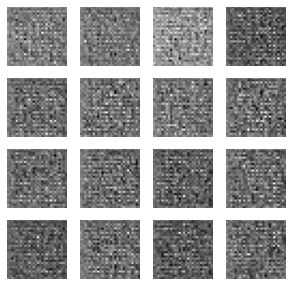

4/4 [==============================] - 0s 2ms/step
100, [D loss: 0.000048, acc.: 0.00%], [G loss: 0.000165]
1/1 [==============================] - 0s 17ms/step


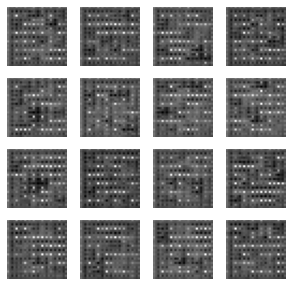

4/4 [==============================] - 0s 2ms/step
200, [D loss: 0.000011, acc.: 0.00%], [G loss: 0.004675]
1/1 [==============================] - 0s 17ms/step


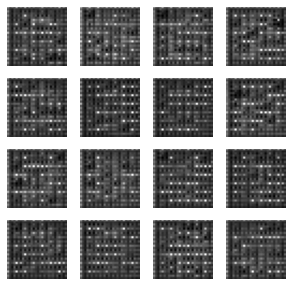

4/4 [==============================] - 0s 2ms/step
300, [D loss: 0.002711, acc.: 0.00%], [G loss: 9.415773]
1/1 [==============================] - 0s 18ms/step


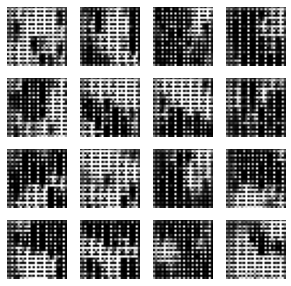

4/4 [==============================] - 0s 2ms/step
400, [D loss: 0.006757, acc.: 0.01%], [G loss: 0.924061]
1/1 [==============================] - 0s 17ms/step


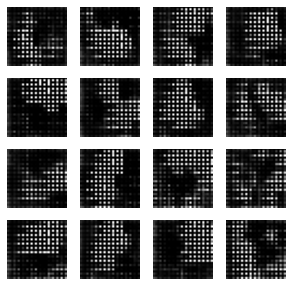

4/4 [==============================] - 0s 2ms/step
500, [D loss: 0.003027, acc.: 0.00%], [G loss: 6.463511]
1/1 [==============================] - 0s 18ms/step


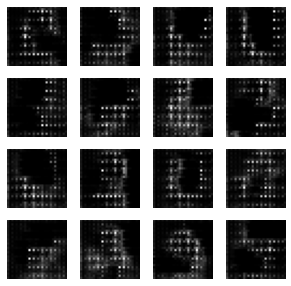

4/4 [==============================] - 0s 2ms/step
600, [D loss: 0.059351, acc.: 0.06%], [G loss: 5.305133]
1/1 [==============================] - 0s 16ms/step


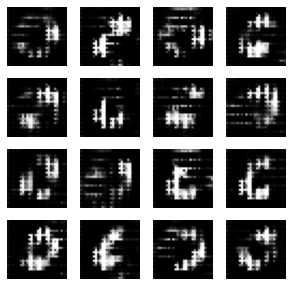

4/4 [==============================] - 0s 2ms/step
700, [D loss: 0.056144, acc.: 0.06%], [G loss: 4.632262]
1/1 [==============================] - 0s 17ms/step


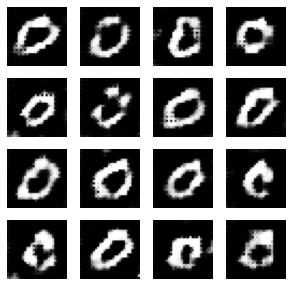

4/4 [==============================] - 0s 2ms/step
800, [D loss: 0.078865, acc.: 0.08%], [G loss: 3.761853]
1/1 [==============================] - 0s 16ms/step


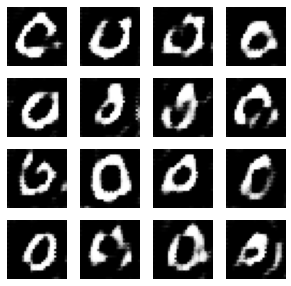

4/4 [==============================] - 0s 2ms/step
900, [D loss: 0.145524, acc.: 0.15%], [G loss: 3.661511]
1/1 [==============================] - 0s 16ms/step


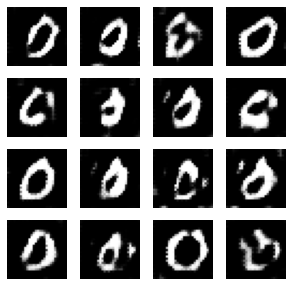

4/4 [==============================] - 0s 2ms/step
1000, [D loss: 0.104571, acc.: 0.10%], [G loss: 2.195176]
1/1 [==============================] - 0s 17ms/step


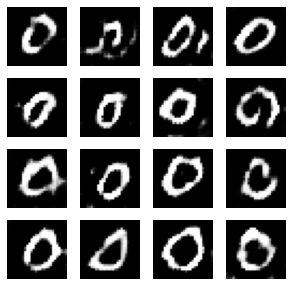

4/4 [==============================] - 0s 2ms/step
1100, [D loss: 0.245676, acc.: 0.25%], [G loss: 2.733263]
1/1 [==============================] - 0s 23ms/step


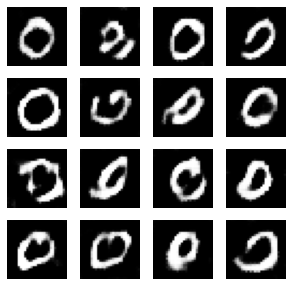

4/4 [==============================] - 0s 2ms/step
1200, [D loss: 0.262551, acc.: 0.26%], [G loss: 3.108260]
1/1 [==============================] - 0s 17ms/step


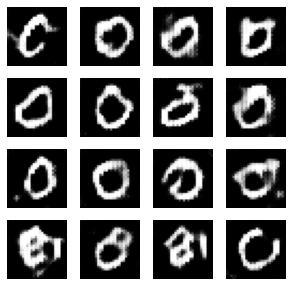

4/4 [==============================] - 0s 2ms/step
1300, [D loss: 0.080224, acc.: 0.08%], [G loss: 3.066690]
1/1 [==============================] - 0s 17ms/step


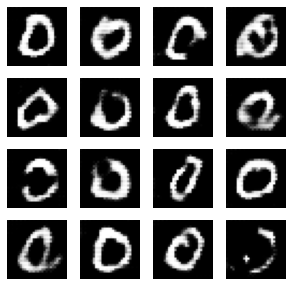

4/4 [==============================] - 0s 2ms/step
1400, [D loss: 0.068441, acc.: 0.07%], [G loss: 3.189286]
1/1 [==============================] - 0s 16ms/step


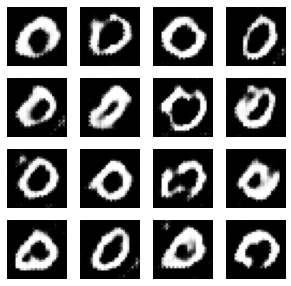

4/4 [==============================] - 0s 2ms/step
1500, [D loss: 0.605330, acc.: 0.61%], [G loss: 1.714457]
1/1 [==============================] - 0s 16ms/step


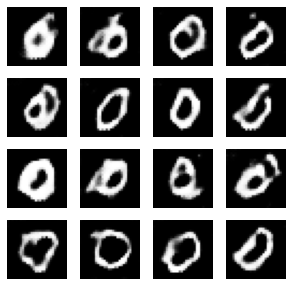

4/4 [==============================] - 0s 3ms/step
1600, [D loss: 0.708056, acc.: 0.71%], [G loss: 2.191536]
1/1 [==============================] - 0s 17ms/step


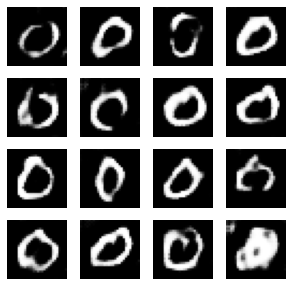

4/4 [==============================] - 0s 2ms/step
1700, [D loss: 0.446829, acc.: 0.45%], [G loss: 2.464762]
1/1 [==============================] - 0s 17ms/step


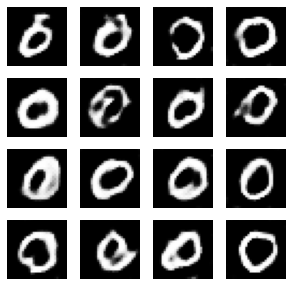

4/4 [==============================] - 0s 2ms/step
1800, [D loss: 0.535956, acc.: 0.54%], [G loss: 2.405436]
1/1 [==============================] - 0s 17ms/step


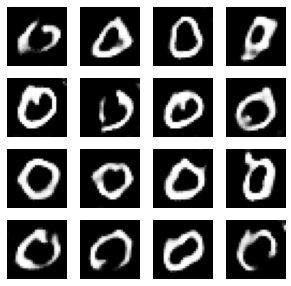

4/4 [==============================] - 0s 2ms/step
1900, [D loss: 0.221743, acc.: 0.22%], [G loss: 2.473470]
1/1 [==============================] - 0s 17ms/step


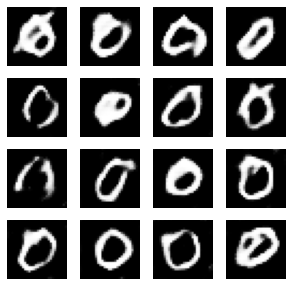

4/4 [==============================] - 0s 2ms/step
2000, [D loss: 0.123374, acc.: 0.12%], [G loss: 2.751841]
1/1 [==============================] - 0s 17ms/step


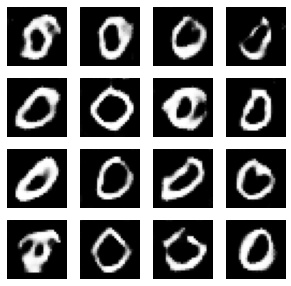

4/4 [==============================] - 0s 2ms/step
2100, [D loss: 0.129613, acc.: 0.13%], [G loss: 3.191013]
1/1 [==============================] - 0s 17ms/step


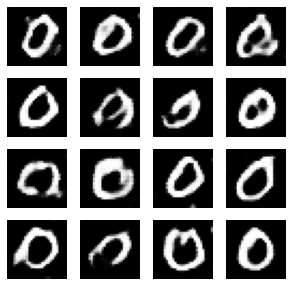

4/4 [==============================] - 0s 2ms/step
2200, [D loss: 0.131835, acc.: 0.13%], [G loss: 3.238355]
1/1 [==============================] - 0s 28ms/step


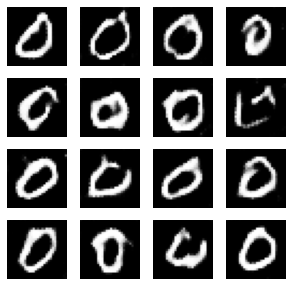

4/4 [==============================] - 0s 2ms/step
2300, [D loss: 0.193923, acc.: 0.19%], [G loss: 2.412943]
1/1 [==============================] - 0s 17ms/step


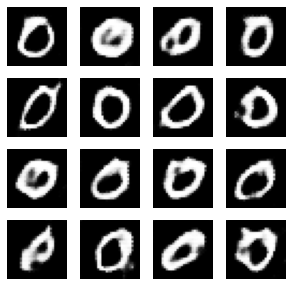

4/4 [==============================] - 0s 2ms/step
2400, [D loss: 0.415882, acc.: 0.42%], [G loss: 2.289863]
1/1 [==============================] - 0s 17ms/step


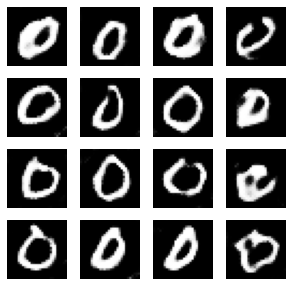

4/4 [==============================] - 0s 2ms/step
2500, [D loss: 0.564356, acc.: 0.56%], [G loss: 2.123481]
1/1 [==============================] - 0s 16ms/step


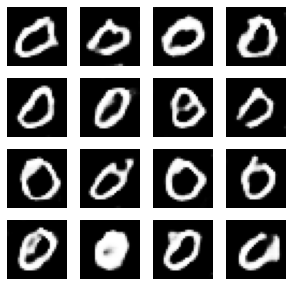

4/4 [==============================] - 0s 2ms/step
2600, [D loss: 0.396138, acc.: 0.40%], [G loss: 2.784881]
1/1 [==============================] - 0s 17ms/step


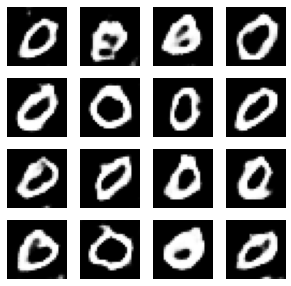

4/4 [==============================] - 0s 2ms/step
2700, [D loss: 0.256587, acc.: 0.26%], [G loss: 3.163141]
1/1 [==============================] - 0s 17ms/step


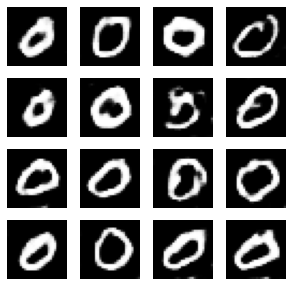

4/4 [==============================] - 0s 2ms/step
2800, [D loss: 0.198166, acc.: 0.20%], [G loss: 3.269685]
1/1 [==============================] - 0s 22ms/step


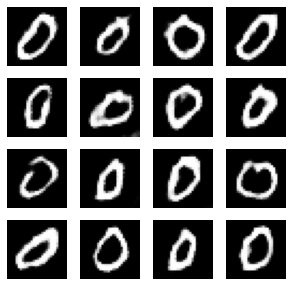

4/4 [==============================] - 0s 2ms/step
2900, [D loss: 0.197240, acc.: 0.20%], [G loss: 3.267480]
1/1 [==============================] - 0s 16ms/step


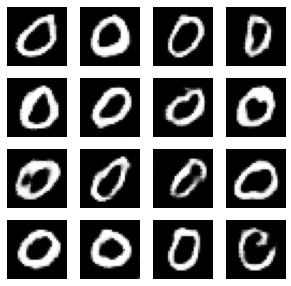

4/4 [==============================] - 0s 2ms/step
3000, [D loss: 0.343129, acc.: 0.34%], [G loss: 2.381517]
1/1 [==============================] - 0s 16ms/step


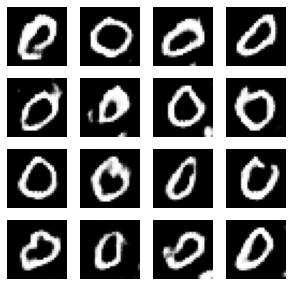

4/4 [==============================] - 0s 2ms/step
3100, [D loss: 0.502304, acc.: 0.50%], [G loss: 1.994281]
1/1 [==============================] - 0s 17ms/step


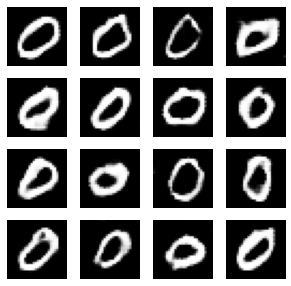

4/4 [==============================] - 0s 2ms/step
3200, [D loss: 0.606443, acc.: 0.61%], [G loss: 1.881699]
1/1 [==============================] - 0s 16ms/step


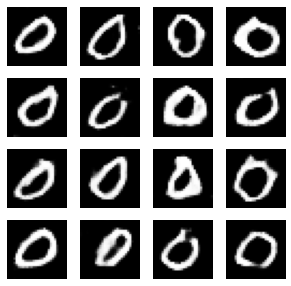

4/4 [==============================] - 0s 2ms/step
3300, [D loss: 0.318683, acc.: 0.32%], [G loss: 2.076268]
1/1 [==============================] - 0s 16ms/step


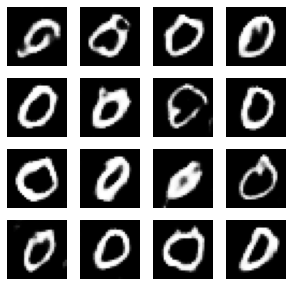

4/4 [==============================] - 0s 2ms/step
3400, [D loss: 0.164026, acc.: 0.16%], [G loss: 2.954787]
1/1 [==============================] - 0s 17ms/step


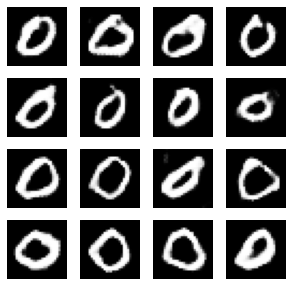

4/4 [==============================] - 0s 2ms/step
3500, [D loss: 0.171894, acc.: 0.17%], [G loss: 2.575485]
1/1 [==============================] - 0s 18ms/step


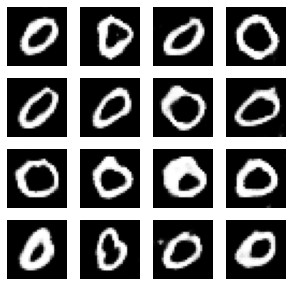

4/4 [==============================] - 0s 2ms/step
3600, [D loss: 0.340260, acc.: 0.34%], [G loss: 1.914502]
1/1 [==============================] - 0s 17ms/step


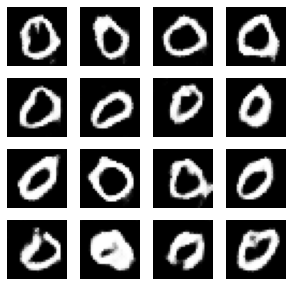

4/4 [==============================] - 0s 2ms/step
3700, [D loss: 0.558064, acc.: 0.56%], [G loss: 1.864972]
1/1 [==============================] - 0s 17ms/step


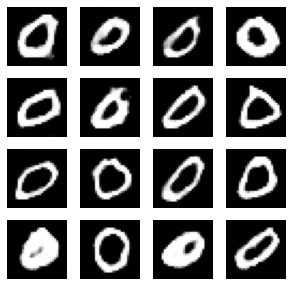

4/4 [==============================] - 0s 2ms/step
3800, [D loss: 0.487124, acc.: 0.49%], [G loss: 1.968962]
1/1 [==============================] - 0s 16ms/step


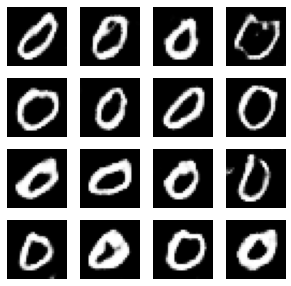

4/4 [==============================] - 0s 3ms/step
3900, [D loss: 0.298354, acc.: 0.30%], [G loss: 2.901512]
1/1 [==============================] - 0s 16ms/step


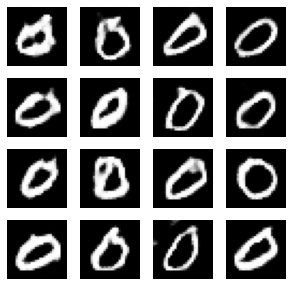

4/4 [==============================] - 0s 2ms/step
4000, [D loss: 0.181268, acc.: 0.18%], [G loss: 2.737036]
1/1 [==============================] - 0s 17ms/step


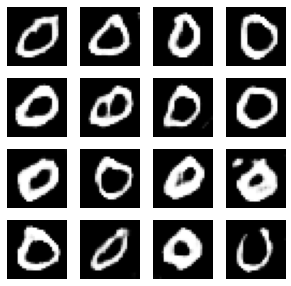

4/4 [==============================] - 0s 3ms/step
4100, [D loss: 0.409025, acc.: 0.41%], [G loss: 2.210998]
1/1 [==============================] - 0s 17ms/step


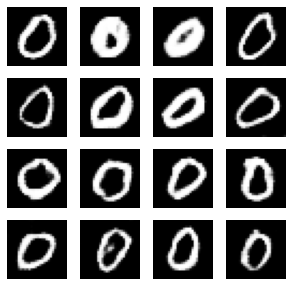

4/4 [==============================] - 0s 2ms/step
4200, [D loss: 0.557148, acc.: 0.56%], [G loss: 1.834798]
1/1 [==============================] - 0s 17ms/step


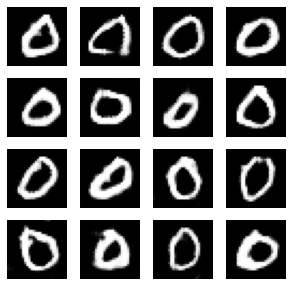

4/4 [==============================] - 0s 2ms/step
4300, [D loss: 0.453552, acc.: 0.45%], [G loss: 2.433197]
1/1 [==============================] - 0s 18ms/step


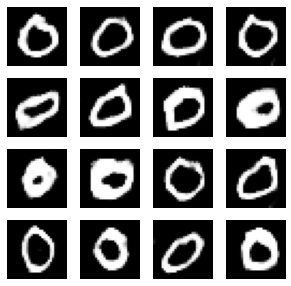

4/4 [==============================] - 0s 2ms/step
4400, [D loss: 0.277211, acc.: 0.28%], [G loss: 2.308163]
1/1 [==============================] - 0s 16ms/step


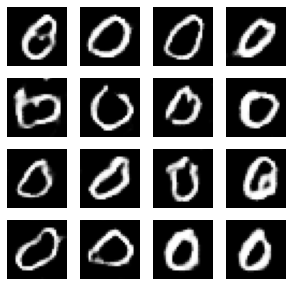

4/4 [==============================] - 0s 2ms/step
4500, [D loss: 0.302918, acc.: 0.30%], [G loss: 2.519773]
1/1 [==============================] - 0s 18ms/step


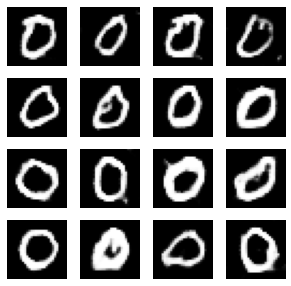

4/4 [==============================] - 0s 3ms/step
4600, [D loss: 0.241394, acc.: 0.24%], [G loss: 2.573576]
1/1 [==============================] - 0s 17ms/step


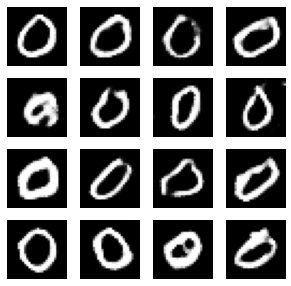

4/4 [==============================] - 0s 2ms/step
4700, [D loss: 0.280939, acc.: 0.28%], [G loss: 1.891720]
1/1 [==============================] - 0s 17ms/step


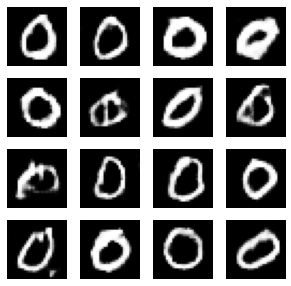

4/4 [==============================] - 0s 2ms/step
4800, [D loss: 0.277937, acc.: 0.28%], [G loss: 2.186382]
1/1 [==============================] - 0s 18ms/step


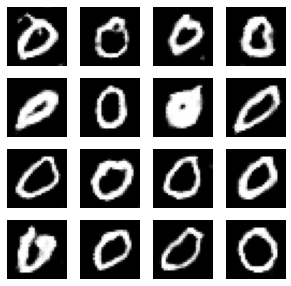

4/4 [==============================] - 0s 2ms/step
4900, [D loss: 0.419483, acc.: 0.42%], [G loss: 1.785713]
1/1 [==============================] - 0s 17ms/step


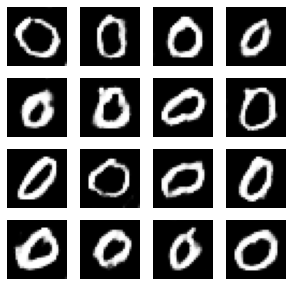

4/4 [==============================] - 0s 2ms/step
5000, [D loss: 0.536601, acc.: 0.54%], [G loss: 1.721552]
1/1 [==============================] - 0s 17ms/step


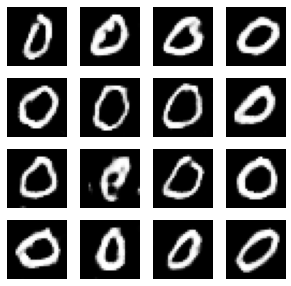

4/4 [==============================] - 0s 2ms/step
5100, [D loss: 0.594454, acc.: 0.59%], [G loss: 1.536628]
1/1 [==============================] - 0s 16ms/step


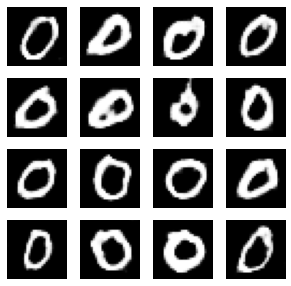

4/4 [==============================] - 0s 2ms/step
5200, [D loss: 0.257666, acc.: 0.26%], [G loss: 2.925501]
1/1 [==============================] - 0s 17ms/step


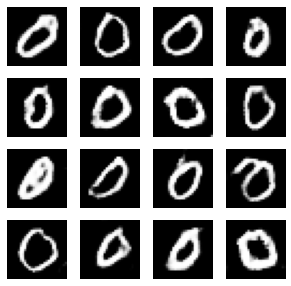

4/4 [==============================] - 0s 2ms/step
5300, [D loss: 0.212412, acc.: 0.21%], [G loss: 3.049635]
1/1 [==============================] - 0s 17ms/step


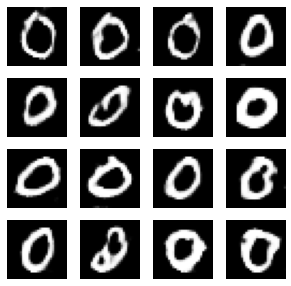

4/4 [==============================] - 0s 2ms/step
5400, [D loss: 0.233448, acc.: 0.23%], [G loss: 2.726705]
1/1 [==============================] - 0s 17ms/step


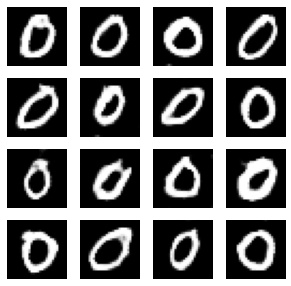

4/4 [==============================] - 0s 2ms/step
5500, [D loss: 0.262248, acc.: 0.26%], [G loss: 2.503634]
1/1 [==============================] - 0s 17ms/step


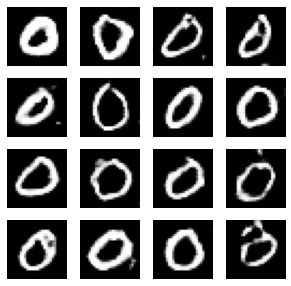

4/4 [==============================] - 0s 2ms/step
5600, [D loss: 0.207442, acc.: 0.21%], [G loss: 2.414590]
1/1 [==============================] - 0s 21ms/step


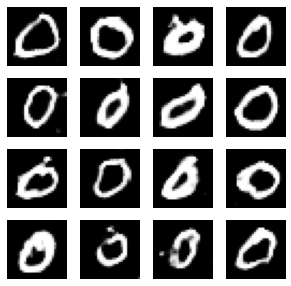

4/4 [==============================] - 0s 2ms/step
5700, [D loss: 0.302471, acc.: 0.30%], [G loss: 2.821480]
1/1 [==============================] - 0s 17ms/step


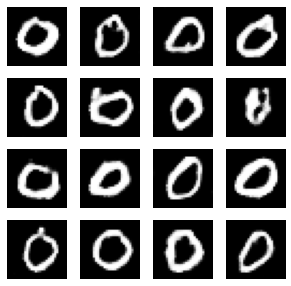

4/4 [==============================] - 0s 2ms/step
5800, [D loss: 0.240489, acc.: 0.24%], [G loss: 2.465436]
1/1 [==============================] - 0s 18ms/step


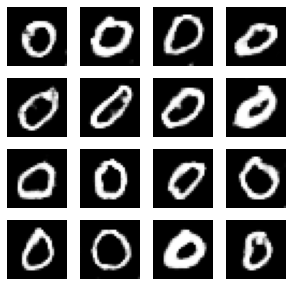

4/4 [==============================] - 0s 2ms/step
5900, [D loss: 0.211881, acc.: 0.21%], [G loss: 2.360175]
1/1 [==============================] - 0s 17ms/step


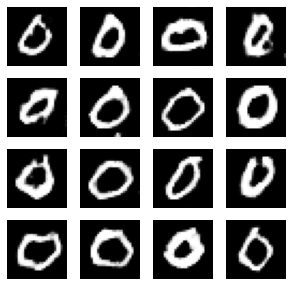

4/4 [==============================] - 0s 2ms/step
6000, [D loss: 0.134884, acc.: 0.13%], [G loss: 3.365221]
1/1 [==============================] - 0s 16ms/step


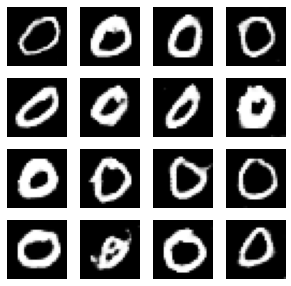

4/4 [==============================] - 0s 2ms/step
6100, [D loss: 0.306918, acc.: 0.31%], [G loss: 2.614497]
1/1 [==============================] - 0s 18ms/step


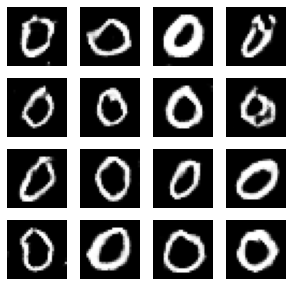

4/4 [==============================] - 0s 2ms/step
6200, [D loss: 0.232483, acc.: 0.23%], [G loss: 2.686473]
1/1 [==============================] - 0s 17ms/step


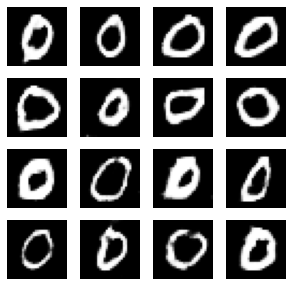

4/4 [==============================] - 0s 2ms/step
6300, [D loss: 0.225624, acc.: 0.23%], [G loss: 3.280964]
1/1 [==============================] - 0s 17ms/step


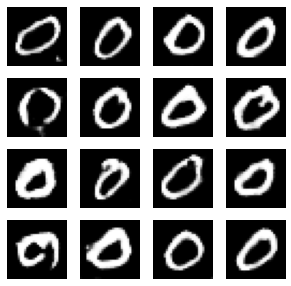

4/4 [==============================] - 0s 2ms/step
6400, [D loss: 0.273036, acc.: 0.27%], [G loss: 2.544724]
1/1 [==============================] - 0s 17ms/step


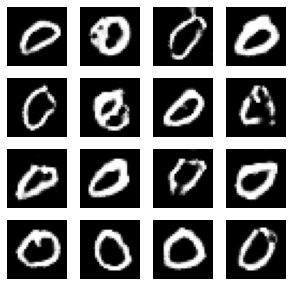

4/4 [==============================] - 0s 2ms/step
6500, [D loss: 0.227389, acc.: 0.23%], [G loss: 2.797538]
1/1 [==============================] - 0s 18ms/step


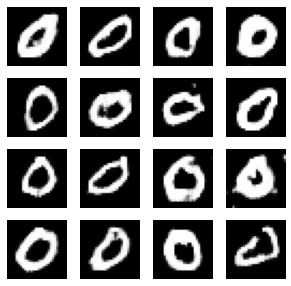

4/4 [==============================] - 0s 2ms/step
6600, [D loss: 0.430032, acc.: 0.43%], [G loss: 2.161869]
1/1 [==============================] - 0s 19ms/step


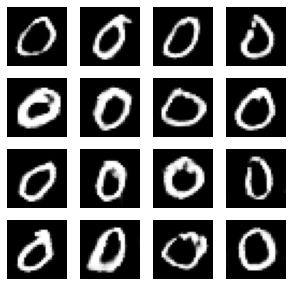

4/4 [==============================] - 0s 2ms/step
6700, [D loss: 0.598663, acc.: 0.60%], [G loss: 1.951325]
1/1 [==============================] - 0s 18ms/step


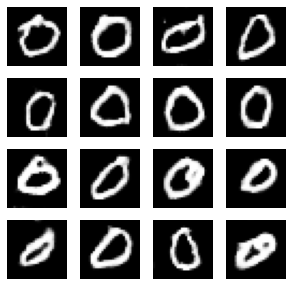

4/4 [==============================] - 0s 3ms/step
6800, [D loss: 0.522559, acc.: 0.52%], [G loss: 2.485862]
1/1 [==============================] - 0s 17ms/step


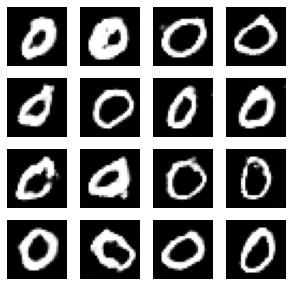

4/4 [==============================] - 0s 2ms/step
6900, [D loss: 0.302945, acc.: 0.30%], [G loss: 2.249854]
1/1 [==============================] - 0s 17ms/step


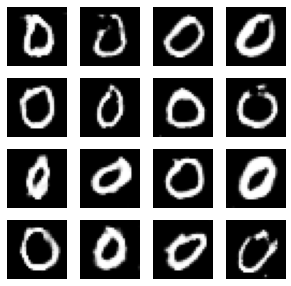

4/4 [==============================] - 0s 2ms/step
7000, [D loss: 0.453188, acc.: 0.45%], [G loss: 1.930288]
1/1 [==============================] - 0s 19ms/step


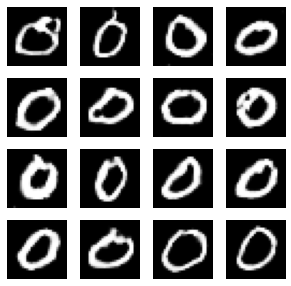

4/4 [==============================] - 0s 2ms/step
7100, [D loss: 0.301480, acc.: 0.30%], [G loss: 2.544659]
1/1 [==============================] - 0s 17ms/step


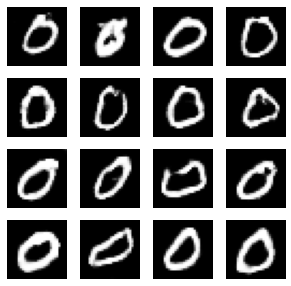

4/4 [==============================] - 0s 2ms/step
7200, [D loss: 0.174346, acc.: 0.17%], [G loss: 3.492928]
1/1 [==============================] - 0s 17ms/step


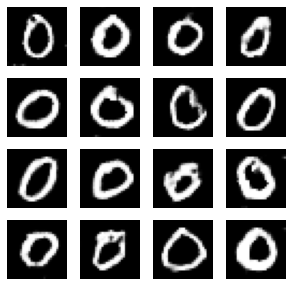

4/4 [==============================] - 0s 2ms/step
7300, [D loss: 0.377033, acc.: 0.38%], [G loss: 1.927660]
1/1 [==============================] - 0s 17ms/step


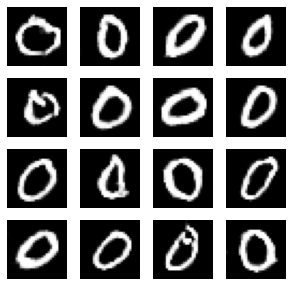

4/4 [==============================] - 0s 2ms/step
7400, [D loss: 0.325160, acc.: 0.33%], [G loss: 1.956320]
1/1 [==============================] - 0s 17ms/step


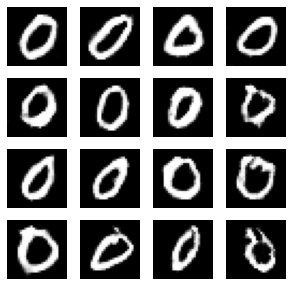

4/4 [==============================] - 0s 2ms/step
7500, [D loss: 0.323309, acc.: 0.32%], [G loss: 2.499288]
1/1 [==============================] - 0s 16ms/step


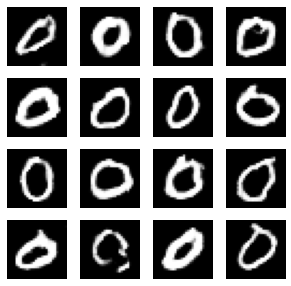

4/4 [==============================] - 0s 2ms/step
7600, [D loss: 0.512584, acc.: 0.51%], [G loss: 2.073841]
1/1 [==============================] - 0s 16ms/step


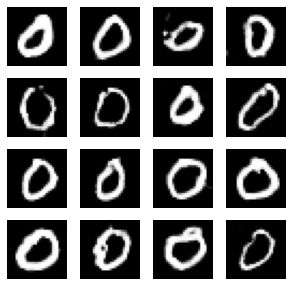

4/4 [==============================] - 0s 2ms/step
7700, [D loss: 0.545921, acc.: 0.55%], [G loss: 1.591073]
1/1 [==============================] - 0s 16ms/step


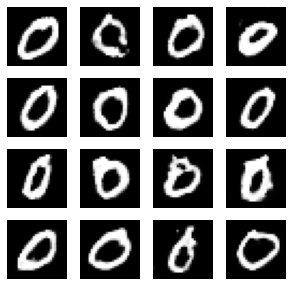

4/4 [==============================] - 0s 2ms/step
7800, [D loss: 0.371659, acc.: 0.37%], [G loss: 2.174911]
1/1 [==============================] - 0s 16ms/step


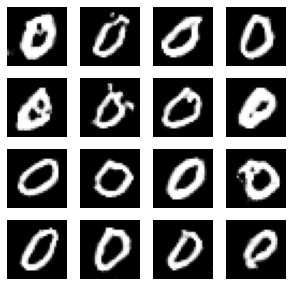

4/4 [==============================] - 0s 2ms/step
7900, [D loss: 0.459330, acc.: 0.46%], [G loss: 2.077441]
1/1 [==============================] - 0s 16ms/step


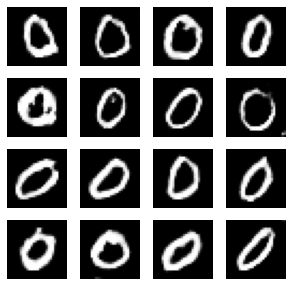

4/4 [==============================] - 0s 2ms/step
8000, [D loss: 0.303930, acc.: 0.30%], [G loss: 2.243372]
1/1 [==============================] - 0s 16ms/step


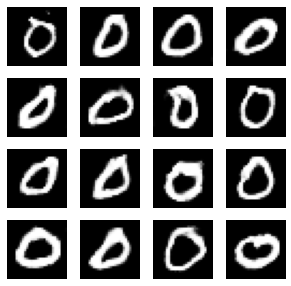

4/4 [==============================] - 0s 2ms/step
8100, [D loss: 0.357076, acc.: 0.36%], [G loss: 2.441256]
1/1 [==============================] - 0s 17ms/step


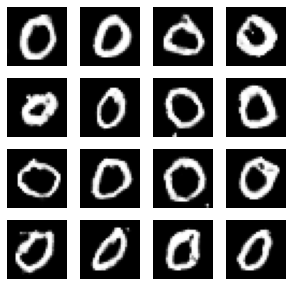

4/4 [==============================] - 0s 2ms/step
8200, [D loss: 0.252512, acc.: 0.25%], [G loss: 2.308646]
1/1 [==============================] - 0s 16ms/step


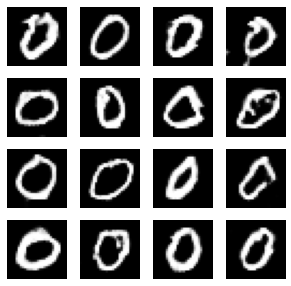

4/4 [==============================] - 0s 2ms/step
8300, [D loss: 0.255596, acc.: 0.26%], [G loss: 2.873554]
1/1 [==============================] - 0s 18ms/step


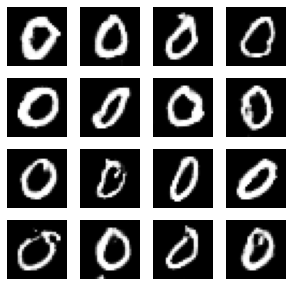

4/4 [==============================] - 0s 3ms/step
8400, [D loss: 0.178035, acc.: 0.18%], [G loss: 3.126338]
1/1 [==============================] - 0s 17ms/step


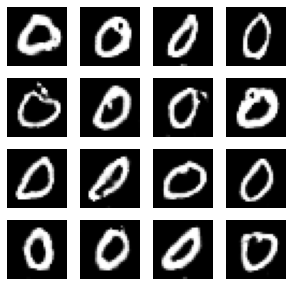

4/4 [==============================] - 0s 2ms/step
8500, [D loss: 0.407522, acc.: 0.41%], [G loss: 2.739186]
1/1 [==============================] - 0s 17ms/step


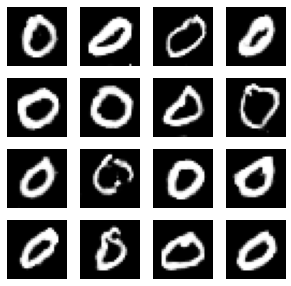

4/4 [==============================] - 0s 2ms/step
8600, [D loss: 0.425490, acc.: 0.43%], [G loss: 1.965679]
1/1 [==============================] - 0s 17ms/step


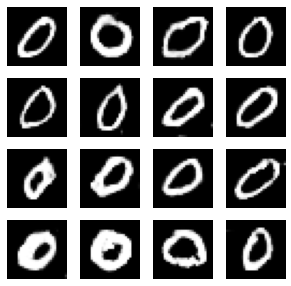

4/4 [==============================] - 0s 2ms/step
8700, [D loss: 0.530831, acc.: 0.53%], [G loss: 1.770123]
1/1 [==============================] - 0s 19ms/step


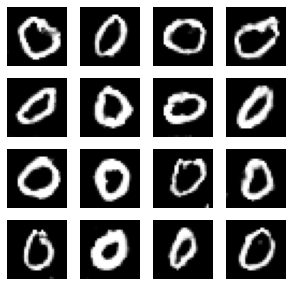

4/4 [==============================] - 0s 2ms/step
8800, [D loss: 0.452563, acc.: 0.45%], [G loss: 1.922478]
1/1 [==============================] - 0s 17ms/step


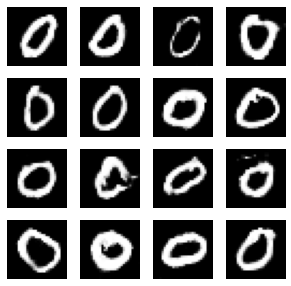

4/4 [==============================] - 0s 2ms/step
8900, [D loss: 0.418788, acc.: 0.42%], [G loss: 2.719334]
1/1 [==============================] - 0s 16ms/step


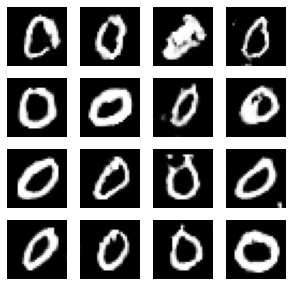

4/4 [==============================] - 0s 2ms/step
9000, [D loss: 0.398381, acc.: 0.40%], [G loss: 2.603200]
1/1 [==============================] - 0s 17ms/step


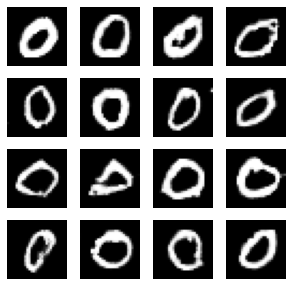

4/4 [==============================] - 0s 2ms/step
9100, [D loss: 0.204071, acc.: 0.20%], [G loss: 3.016898]
1/1 [==============================] - 0s 17ms/step


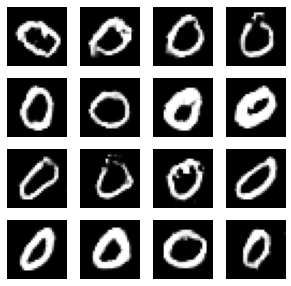

4/4 [==============================] - 0s 2ms/step
9200, [D loss: 0.263624, acc.: 0.26%], [G loss: 2.976855]
1/1 [==============================] - 0s 17ms/step


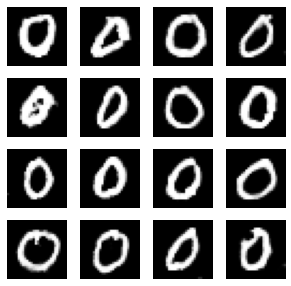

4/4 [==============================] - 0s 2ms/step
9300, [D loss: 0.219274, acc.: 0.22%], [G loss: 2.888626]
1/1 [==============================] - 0s 17ms/step


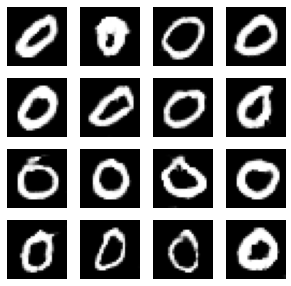

4/4 [==============================] - 0s 2ms/step
9400, [D loss: 0.416073, acc.: 0.42%], [G loss: 1.986280]
1/1 [==============================] - 0s 17ms/step


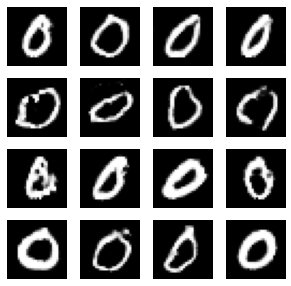

4/4 [==============================] - 0s 2ms/step
9500, [D loss: 0.379364, acc.: 0.38%], [G loss: 2.408217]
1/1 [==============================] - 0s 21ms/step


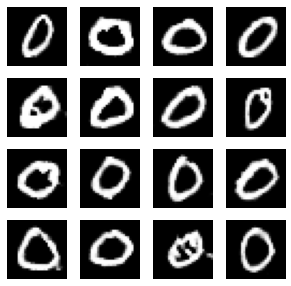

4/4 [==============================] - 0s 2ms/step
9600, [D loss: 0.245839, acc.: 0.25%], [G loss: 2.647633]
1/1 [==============================] - 0s 17ms/step


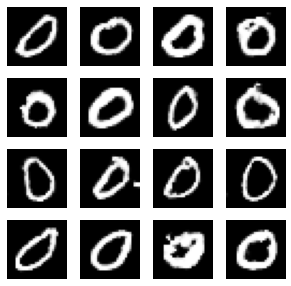

4/4 [==============================] - 0s 2ms/step
9700, [D loss: 0.277255, acc.: 0.28%], [G loss: 2.459351]
1/1 [==============================] - 0s 17ms/step


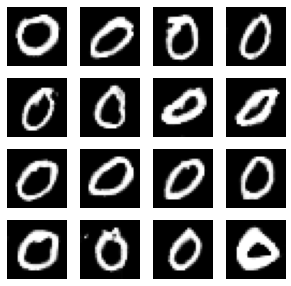

4/4 [==============================] - 0s 2ms/step
9800, [D loss: 0.284033, acc.: 0.28%], [G loss: 2.318513]
1/1 [==============================] - 0s 18ms/step


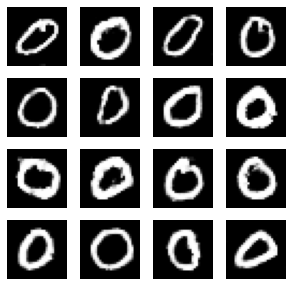

4/4 [==============================] - 0s 3ms/step
9900, [D loss: 0.358939, acc.: 0.36%], [G loss: 2.412868]
1/1 [==============================] - 0s 18ms/step


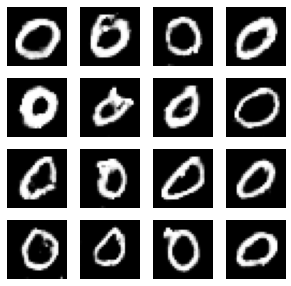

4/4 [==============================] - 0s 2ms/step
10000, [D loss: 0.280002, acc.: 0.28%], [G loss: 2.369067]
1/1 [==============================] - 0s 17ms/step


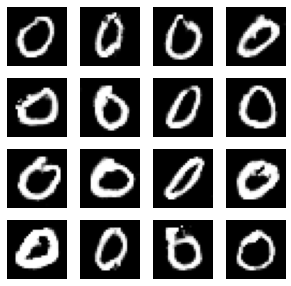

4/4 [==============================] - 0s 2ms/step
10100, [D loss: 0.410883, acc.: 0.41%], [G loss: 2.152270]
1/1 [==============================] - 0s 16ms/step


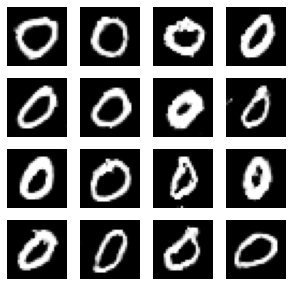

4/4 [==============================] - 0s 2ms/step
10200, [D loss: 0.315481, acc.: 0.32%], [G loss: 2.279514]
1/1 [==============================] - 0s 16ms/step


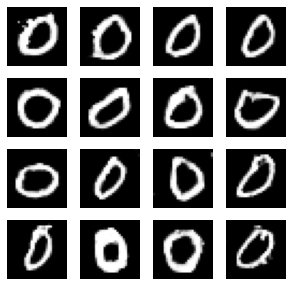

4/4 [==============================] - 0s 2ms/step
10300, [D loss: 0.331667, acc.: 0.33%], [G loss: 2.393230]
1/1 [==============================] - 0s 17ms/step


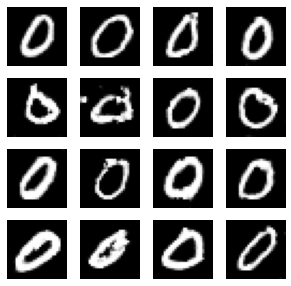

4/4 [==============================] - 0s 2ms/step
10400, [D loss: 0.366436, acc.: 0.37%], [G loss: 1.966303]
1/1 [==============================] - 0s 17ms/step


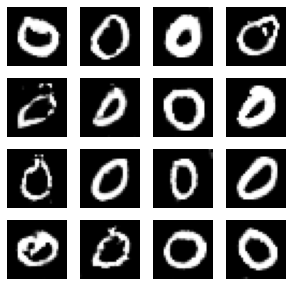

4/4 [==============================] - 0s 2ms/step
10500, [D loss: 0.263160, acc.: 0.26%], [G loss: 2.790591]
1/1 [==============================] - 0s 17ms/step


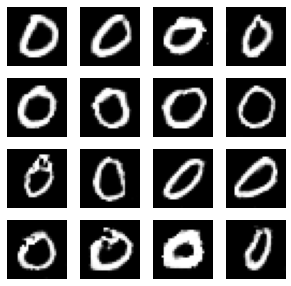

4/4 [==============================] - 0s 2ms/step
10600, [D loss: 0.275147, acc.: 0.28%], [G loss: 3.012607]
1/1 [==============================] - 0s 17ms/step


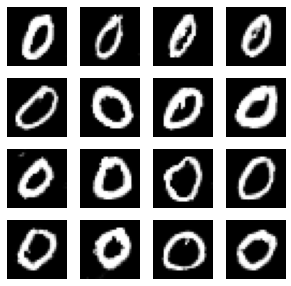

4/4 [==============================] - 0s 2ms/step
10700, [D loss: 0.406676, acc.: 0.41%], [G loss: 2.350837]
1/1 [==============================] - 0s 16ms/step


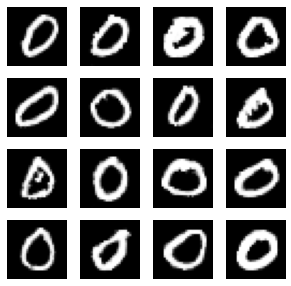

4/4 [==============================] - 0s 2ms/step
10800, [D loss: 0.305747, acc.: 0.31%], [G loss: 2.808161]
1/1 [==============================] - 0s 17ms/step


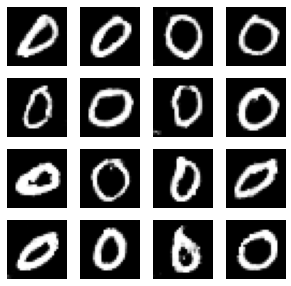

4/4 [==============================] - 0s 2ms/step
10900, [D loss: 0.351601, acc.: 0.35%], [G loss: 2.533167]
1/1 [==============================] - 0s 16ms/step


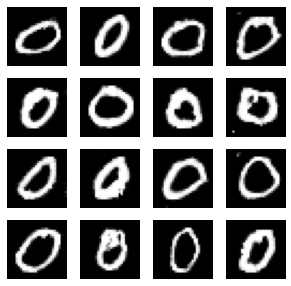

4/4 [==============================] - 0s 2ms/step
11000, [D loss: 0.394979, acc.: 0.39%], [G loss: 2.056341]
1/1 [==============================] - 0s 16ms/step


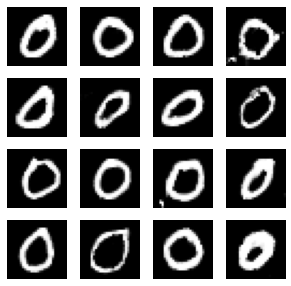

4/4 [==============================] - 0s 2ms/step
11100, [D loss: 0.327789, acc.: 0.33%], [G loss: 2.788306]
1/1 [==============================] - 0s 16ms/step


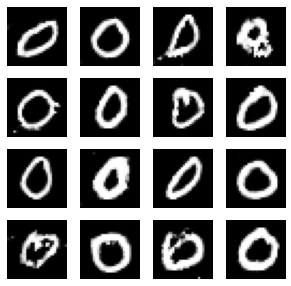

4/4 [==============================] - 0s 2ms/step
11200, [D loss: 0.471776, acc.: 0.47%], [G loss: 2.106237]
1/1 [==============================] - 0s 17ms/step


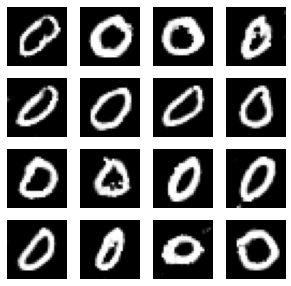

4/4 [==============================] - 0s 2ms/step
11300, [D loss: 0.249649, acc.: 0.25%], [G loss: 2.408488]
1/1 [==============================] - 0s 17ms/step


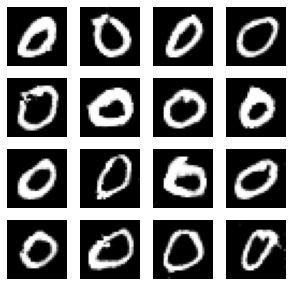

4/4 [==============================] - 0s 2ms/step
11400, [D loss: 0.398005, acc.: 0.40%], [G loss: 2.063131]
1/1 [==============================] - 0s 16ms/step


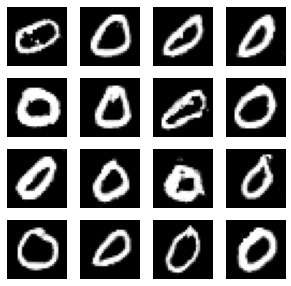

4/4 [==============================] - 0s 2ms/step
11500, [D loss: 0.266255, acc.: 0.27%], [G loss: 3.013245]
1/1 [==============================] - 0s 17ms/step


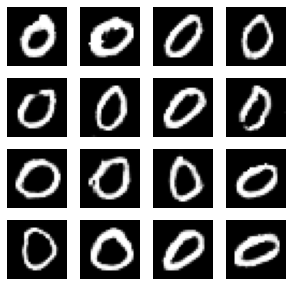

4/4 [==============================] - 0s 2ms/step
11600, [D loss: 0.397204, acc.: 0.40%], [G loss: 2.175983]
1/1 [==============================] - 0s 16ms/step


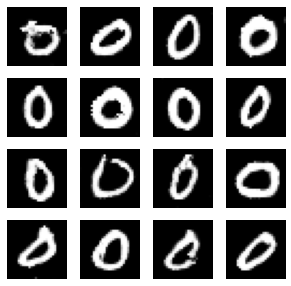

4/4 [==============================] - 0s 2ms/step
11700, [D loss: 0.211588, acc.: 0.21%], [G loss: 2.965223]
1/1 [==============================] - 0s 18ms/step


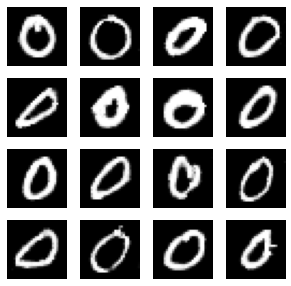

4/4 [==============================] - 0s 2ms/step
11800, [D loss: 0.307772, acc.: 0.31%], [G loss: 2.441375]
1/1 [==============================] - 0s 17ms/step


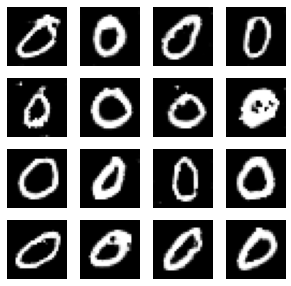

4/4 [==============================] - 0s 2ms/step
11900, [D loss: 0.264336, acc.: 0.26%], [G loss: 3.269212]
1/1 [==============================] - 0s 17ms/step


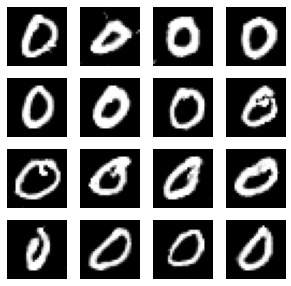

4/4 [==============================] - 0s 2ms/step
12000, [D loss: 0.383812, acc.: 0.38%], [G loss: 2.083267]
1/1 [==============================] - 0s 17ms/step


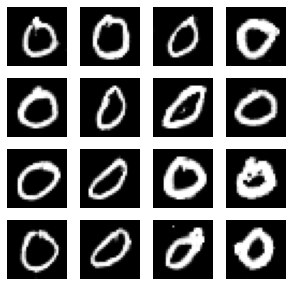

4/4 [==============================] - 0s 3ms/step
12100, [D loss: 0.374051, acc.: 0.37%], [G loss: 2.002497]
1/1 [==============================] - 0s 17ms/step


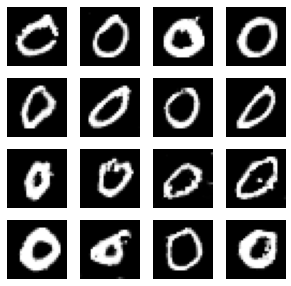

4/4 [==============================] - 0s 2ms/step
12200, [D loss: 0.335362, acc.: 0.34%], [G loss: 2.310091]
1/1 [==============================] - 0s 16ms/step


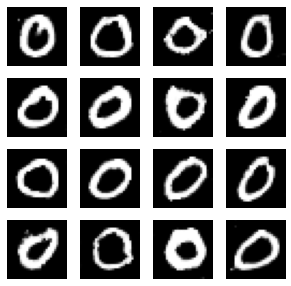

4/4 [==============================] - 0s 2ms/step
12300, [D loss: 0.304243, acc.: 0.30%], [G loss: 2.651208]
1/1 [==============================] - 0s 17ms/step


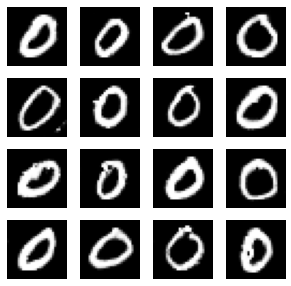

4/4 [==============================] - 0s 2ms/step
12400, [D loss: 0.381553, acc.: 0.38%], [G loss: 2.137608]
1/1 [==============================] - 0s 16ms/step


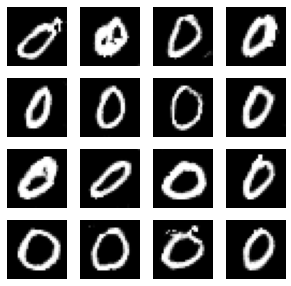

4/4 [==============================] - 0s 2ms/step
12500, [D loss: 0.318356, acc.: 0.32%], [G loss: 2.514235]
1/1 [==============================] - 0s 17ms/step


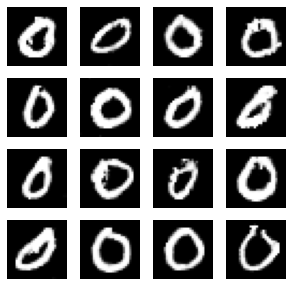

4/4 [==============================] - 0s 2ms/step
12600, [D loss: 0.327985, acc.: 0.33%], [G loss: 2.333064]
1/1 [==============================] - 0s 17ms/step


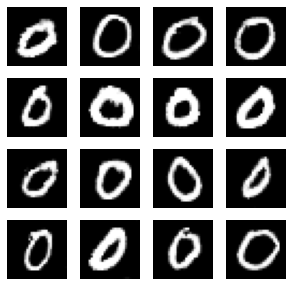

4/4 [==============================] - 0s 2ms/step
12700, [D loss: 0.349725, acc.: 0.35%], [G loss: 2.002816]
1/1 [==============================] - 0s 17ms/step


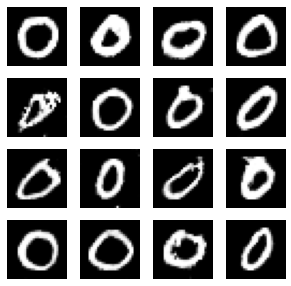

4/4 [==============================] - 0s 2ms/step
12800, [D loss: 0.364113, acc.: 0.36%], [G loss: 2.469474]
1/1 [==============================] - 0s 18ms/step


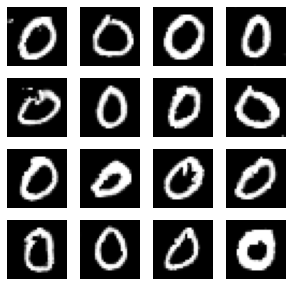

4/4 [==============================] - 0s 2ms/step
12900, [D loss: 0.344031, acc.: 0.34%], [G loss: 2.581214]
1/1 [==============================] - 0s 18ms/step


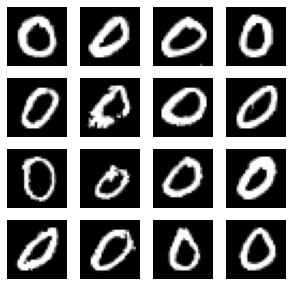

4/4 [==============================] - 0s 2ms/step
13000, [D loss: 0.253773, acc.: 0.25%], [G loss: 2.796211]
1/1 [==============================] - 0s 17ms/step


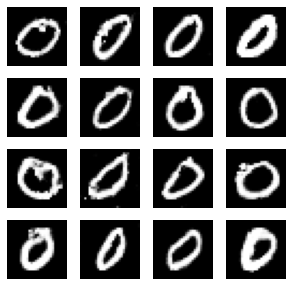

4/4 [==============================] - 0s 2ms/step
13100, [D loss: 0.190678, acc.: 0.19%], [G loss: 2.862191]
1/1 [==============================] - 0s 17ms/step


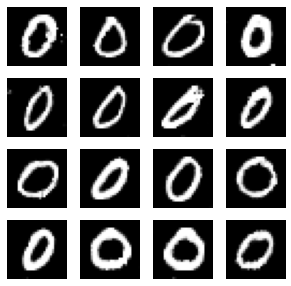

4/4 [==============================] - 0s 2ms/step
13200, [D loss: 0.294071, acc.: 0.29%], [G loss: 2.349037]
1/1 [==============================] - 0s 17ms/step


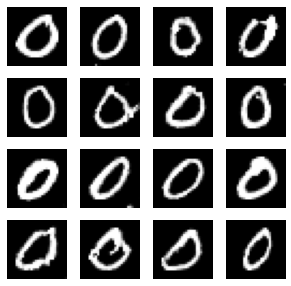

4/4 [==============================] - 0s 2ms/step
13300, [D loss: 0.373532, acc.: 0.37%], [G loss: 2.569660]
1/1 [==============================] - 0s 17ms/step


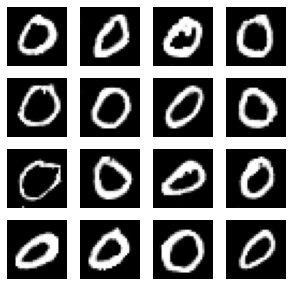

4/4 [==============================] - 0s 2ms/step
13400, [D loss: 0.322083, acc.: 0.32%], [G loss: 3.090242]
1/1 [==============================] - 0s 16ms/step


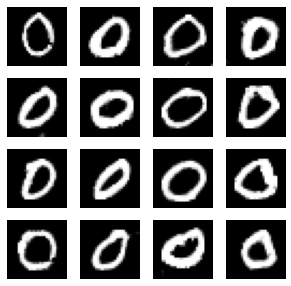

4/4 [==============================] - 0s 2ms/step
13500, [D loss: 0.337613, acc.: 0.34%], [G loss: 2.579849]
1/1 [==============================] - 0s 17ms/step


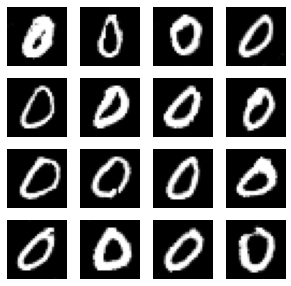

4/4 [==============================] - 0s 2ms/step
13600, [D loss: 0.304416, acc.: 0.30%], [G loss: 2.440726]
1/1 [==============================] - 0s 17ms/step


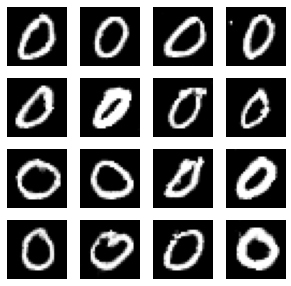

4/4 [==============================] - 0s 2ms/step
13700, [D loss: 0.224404, acc.: 0.22%], [G loss: 3.142122]
1/1 [==============================] - 0s 17ms/step


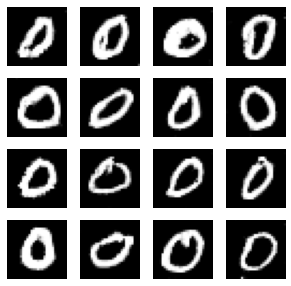

4/4 [==============================] - 0s 2ms/step
13800, [D loss: 0.358715, acc.: 0.36%], [G loss: 2.754219]
1/1 [==============================] - 0s 18ms/step


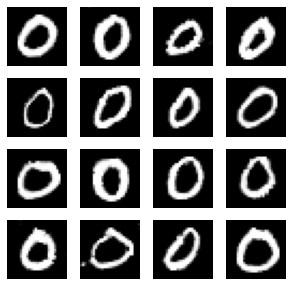

4/4 [==============================] - 0s 3ms/step
13900, [D loss: 0.247242, acc.: 0.25%], [G loss: 2.901710]
1/1 [==============================] - 0s 19ms/step


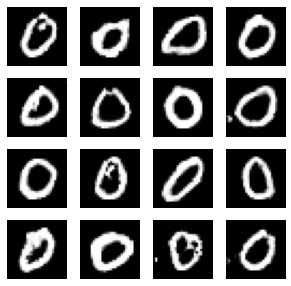

4/4 [==============================] - 0s 2ms/step
14000, [D loss: 0.291279, acc.: 0.29%], [G loss: 2.975831]
1/1 [==============================] - 0s 17ms/step


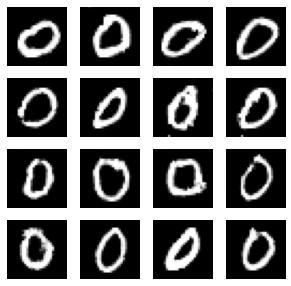

4/4 [==============================] - 0s 2ms/step
14100, [D loss: 0.331288, acc.: 0.33%], [G loss: 2.774577]
1/1 [==============================] - 0s 17ms/step


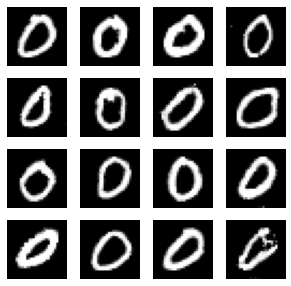

4/4 [==============================] - 0s 2ms/step
14200, [D loss: 0.207964, acc.: 0.21%], [G loss: 3.444965]
1/1 [==============================] - 0s 16ms/step


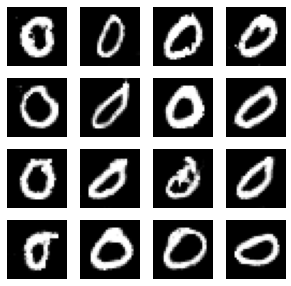

4/4 [==============================] - 0s 2ms/step
14300, [D loss: 0.244333, acc.: 0.24%], [G loss: 3.171609]
1/1 [==============================] - 0s 17ms/step


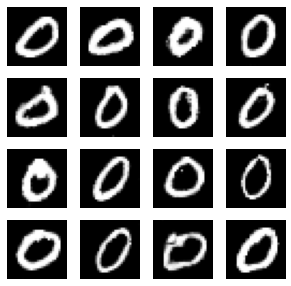

4/4 [==============================] - 0s 2ms/step
14400, [D loss: 0.210626, acc.: 0.21%], [G loss: 2.780260]
1/1 [==============================] - 0s 16ms/step


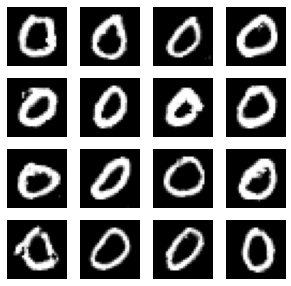

4/4 [==============================] - 0s 2ms/step
14500, [D loss: 0.239457, acc.: 0.24%], [G loss: 3.169314]
1/1 [==============================] - 0s 17ms/step


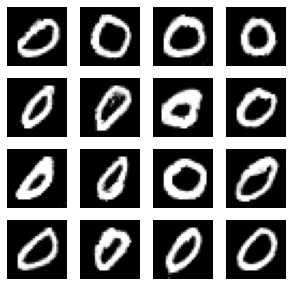

4/4 [==============================] - 0s 2ms/step
14600, [D loss: 0.189229, acc.: 0.19%], [G loss: 3.141441]
1/1 [==============================] - 0s 18ms/step


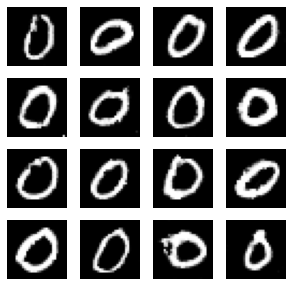

4/4 [==============================] - 0s 2ms/step
14700, [D loss: 0.218343, acc.: 0.22%], [G loss: 3.121122]
1/1 [==============================] - 0s 17ms/step


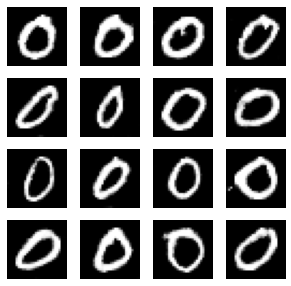

4/4 [==============================] - 0s 2ms/step
14800, [D loss: 0.276071, acc.: 0.28%], [G loss: 3.463710]
1/1 [==============================] - 0s 18ms/step


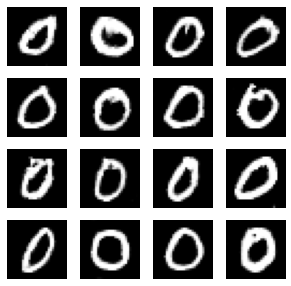

4/4 [==============================] - 0s 2ms/step
14900, [D loss: 0.402986, acc.: 0.40%], [G loss: 2.833766]
1/1 [==============================] - 0s 17ms/step


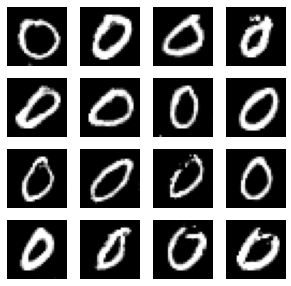

4/4 [==============================] - 0s 2ms/step
15000, [D loss: 0.351711, acc.: 0.35%], [G loss: 2.753698]
1/1 [==============================] - 0s 16ms/step


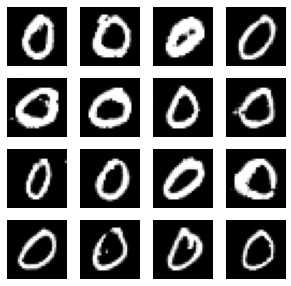

4/4 [==============================] - 0s 2ms/step
15100, [D loss: 0.260309, acc.: 0.26%], [G loss: 3.526862]
1/1 [==============================] - 0s 16ms/step


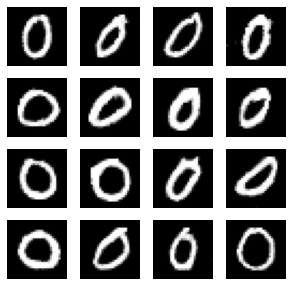

4/4 [==============================] - 0s 2ms/step
15200, [D loss: 0.258878, acc.: 0.26%], [G loss: 3.216496]
1/1 [==============================] - 0s 16ms/step


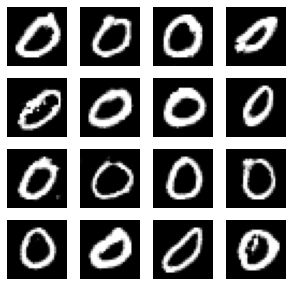

4/4 [==============================] - 0s 2ms/step
15300, [D loss: 0.291527, acc.: 0.29%], [G loss: 3.393997]
1/1 [==============================] - 0s 16ms/step


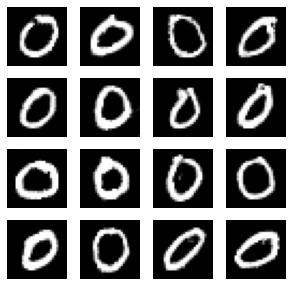

4/4 [==============================] - 0s 2ms/step
15400, [D loss: 0.300613, acc.: 0.30%], [G loss: 2.988888]
1/1 [==============================] - 0s 19ms/step


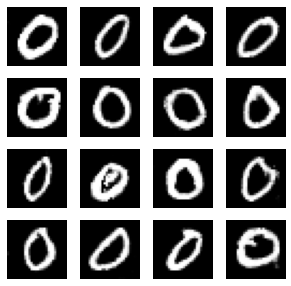

4/4 [==============================] - 0s 2ms/step
15500, [D loss: 0.256499, acc.: 0.26%], [G loss: 3.016712]
1/1 [==============================] - 0s 16ms/step


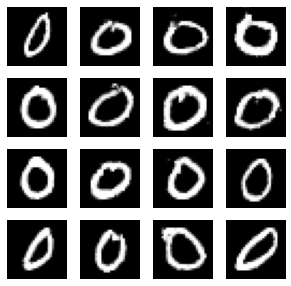

4/4 [==============================] - 0s 2ms/step
15600, [D loss: 0.266030, acc.: 0.27%], [G loss: 3.220605]
1/1 [==============================] - 0s 16ms/step


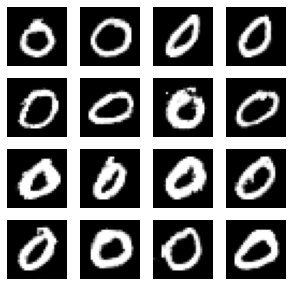

4/4 [==============================] - 0s 2ms/step
15700, [D loss: 0.295800, acc.: 0.30%], [G loss: 2.373066]
1/1 [==============================] - 0s 17ms/step


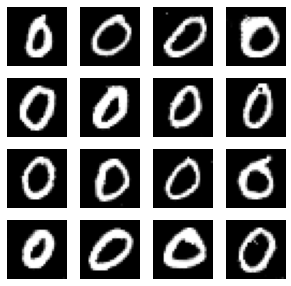

4/4 [==============================] - 0s 2ms/step
15800, [D loss: 0.235221, acc.: 0.24%], [G loss: 2.923491]
1/1 [==============================] - 0s 23ms/step


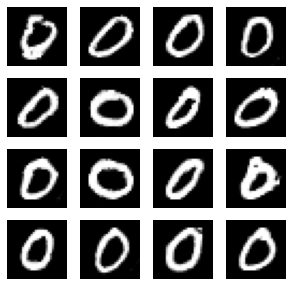

4/4 [==============================] - 0s 2ms/step
15900, [D loss: 0.326180, acc.: 0.33%], [G loss: 2.894275]
1/1 [==============================] - 0s 17ms/step


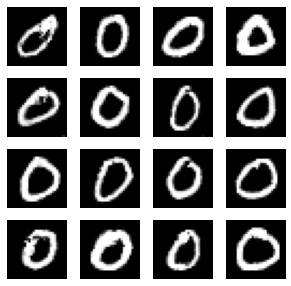

4/4 [==============================] - 0s 2ms/step
16000, [D loss: 0.315284, acc.: 0.32%], [G loss: 2.387701]
1/1 [==============================] - 0s 16ms/step


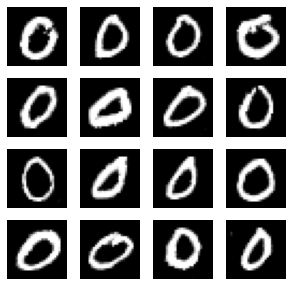

4/4 [==============================] - 0s 3ms/step
16100, [D loss: 0.302566, acc.: 0.30%], [G loss: 3.100595]
1/1 [==============================] - 0s 19ms/step


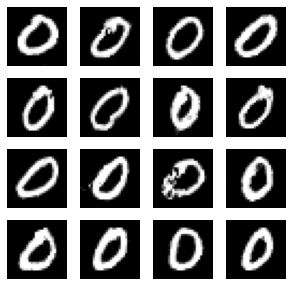

4/4 [==============================] - 0s 3ms/step
16200, [D loss: 0.245201, acc.: 0.25%], [G loss: 3.630053]
1/1 [==============================] - 0s 19ms/step


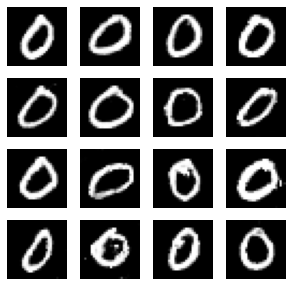

4/4 [==============================] - 0s 2ms/step
16300, [D loss: 0.272407, acc.: 0.27%], [G loss: 3.008028]
1/1 [==============================] - 0s 17ms/step


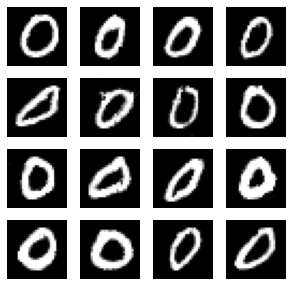

4/4 [==============================] - 0s 2ms/step
16400, [D loss: 0.300745, acc.: 0.30%], [G loss: 3.011584]
1/1 [==============================] - 0s 16ms/step


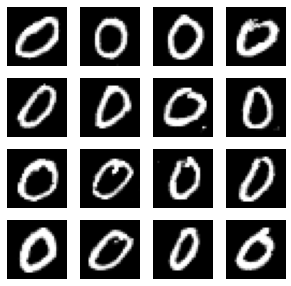

4/4 [==============================] - 0s 2ms/step
16500, [D loss: 0.259104, acc.: 0.26%], [G loss: 3.209024]
1/1 [==============================] - 0s 17ms/step


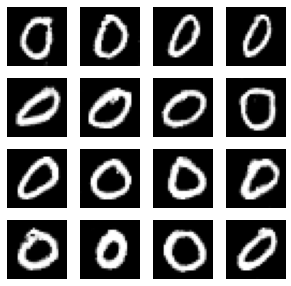

4/4 [==============================] - 0s 2ms/step
16600, [D loss: 0.265579, acc.: 0.27%], [G loss: 3.171031]
1/1 [==============================] - 0s 16ms/step


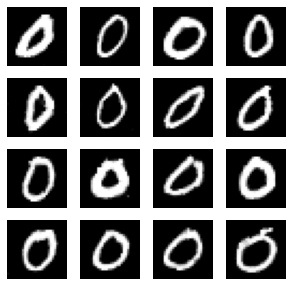

4/4 [==============================] - 0s 5ms/step
16700, [D loss: 0.300008, acc.: 0.30%], [G loss: 3.667721]
1/1 [==============================] - 0s 17ms/step


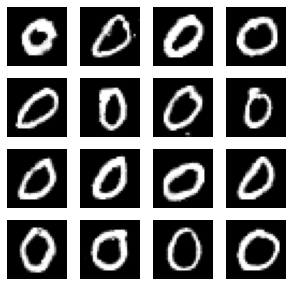

4/4 [==============================] - 0s 2ms/step
16800, [D loss: 0.281825, acc.: 0.28%], [G loss: 2.875538]
1/1 [==============================] - 0s 16ms/step


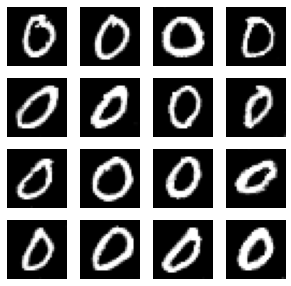

4/4 [==============================] - 0s 2ms/step
16900, [D loss: 0.301189, acc.: 0.30%], [G loss: 3.019162]
1/1 [==============================] - 0s 20ms/step


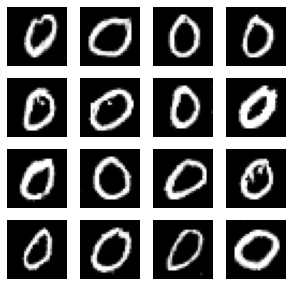

4/4 [==============================] - 0s 3ms/step
17000, [D loss: 0.272309, acc.: 0.27%], [G loss: 2.717572]
1/1 [==============================] - 0s 17ms/step


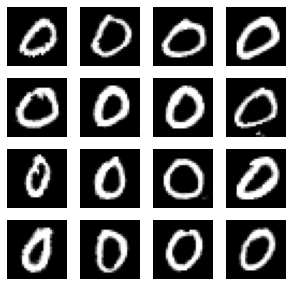

4/4 [==============================] - 0s 2ms/step
17100, [D loss: 0.212751, acc.: 0.21%], [G loss: 3.265976]
1/1 [==============================] - 0s 23ms/step


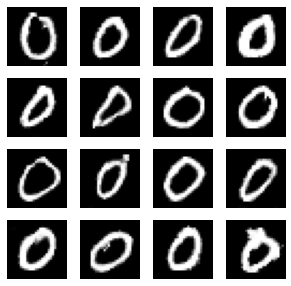

4/4 [==============================] - 0s 2ms/step
17200, [D loss: 0.205996, acc.: 0.21%], [G loss: 3.379354]
1/1 [==============================] - 0s 17ms/step


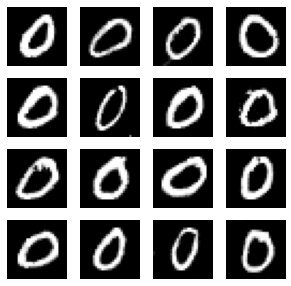

4/4 [==============================] - 0s 3ms/step
17300, [D loss: 0.236795, acc.: 0.24%], [G loss: 2.660331]
1/1 [==============================] - 0s 18ms/step


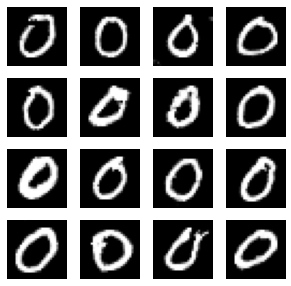

4/4 [==============================] - 0s 2ms/step
17400, [D loss: 0.267489, acc.: 0.27%], [G loss: 3.442848]
1/1 [==============================] - 0s 18ms/step


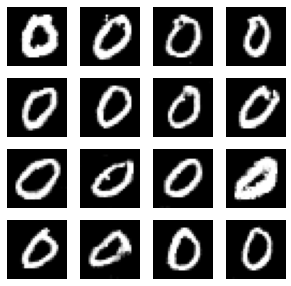

4/4 [==============================] - 0s 2ms/step
17500, [D loss: 0.195050, acc.: 0.20%], [G loss: 3.553671]
1/1 [==============================] - 0s 16ms/step


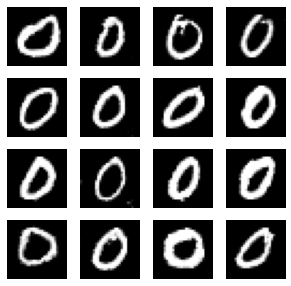

4/4 [==============================] - 0s 2ms/step
17600, [D loss: 0.268939, acc.: 0.27%], [G loss: 3.593442]
1/1 [==============================] - 0s 15ms/step


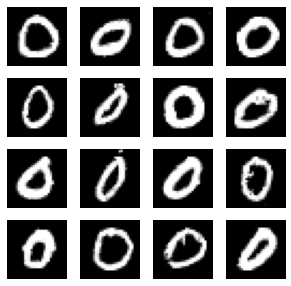

4/4 [==============================] - 0s 2ms/step
17700, [D loss: 0.206829, acc.: 0.21%], [G loss: 3.700449]
1/1 [==============================] - 0s 16ms/step


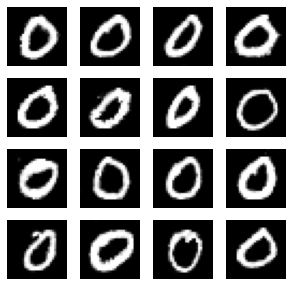

4/4 [==============================] - 0s 2ms/step
17800, [D loss: 0.222670, acc.: 0.22%], [G loss: 3.483811]
1/1 [==============================] - 0s 16ms/step


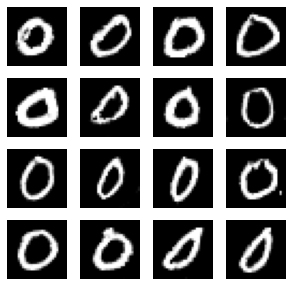

4/4 [==============================] - 0s 2ms/step
17900, [D loss: 0.237597, acc.: 0.24%], [G loss: 3.529060]
1/1 [==============================] - 0s 16ms/step


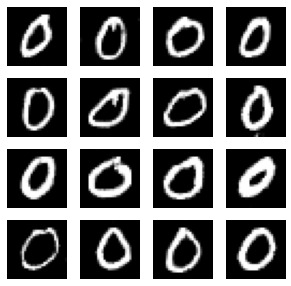

4/4 [==============================] - 0s 2ms/step
18000, [D loss: 0.163476, acc.: 0.16%], [G loss: 3.799520]
1/1 [==============================] - 0s 17ms/step


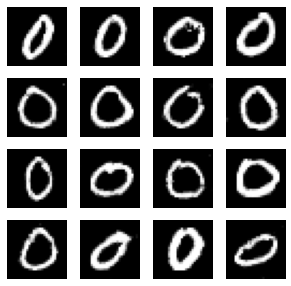

4/4 [==============================] - 0s 2ms/step
18100, [D loss: 0.224813, acc.: 0.22%], [G loss: 3.794568]
1/1 [==============================] - 0s 17ms/step


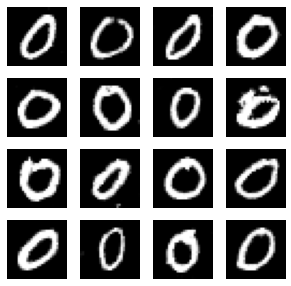

4/4 [==============================] - 0s 2ms/step
18200, [D loss: 0.208652, acc.: 0.21%], [G loss: 3.503907]
1/1 [==============================] - 0s 17ms/step


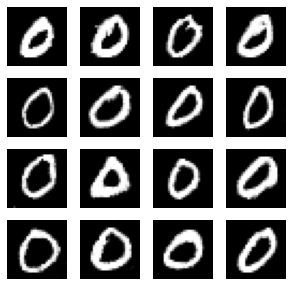

4/4 [==============================] - 0s 2ms/step
18300, [D loss: 0.200495, acc.: 0.20%], [G loss: 3.971523]
1/1 [==============================] - 0s 17ms/step


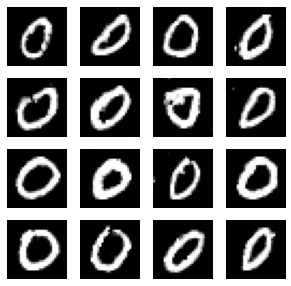

4/4 [==============================] - 0s 2ms/step
18400, [D loss: 0.215825, acc.: 0.22%], [G loss: 3.533267]
1/1 [==============================] - 0s 16ms/step


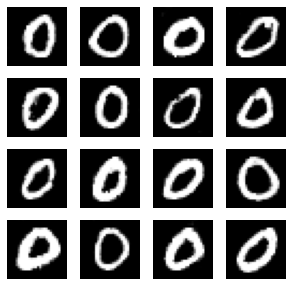

4/4 [==============================] - 0s 2ms/step
18500, [D loss: 0.168265, acc.: 0.17%], [G loss: 3.321043]
1/1 [==============================] - 0s 16ms/step


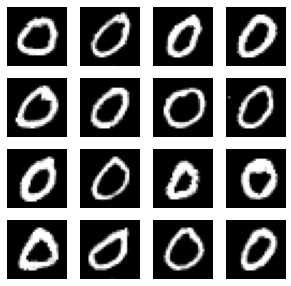

4/4 [==============================] - 0s 2ms/step
18600, [D loss: 0.246145, acc.: 0.25%], [G loss: 3.549396]
1/1 [==============================] - 0s 16ms/step


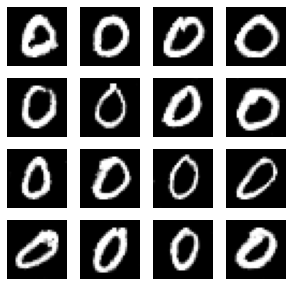

4/4 [==============================] - 0s 2ms/step
18700, [D loss: 0.227463, acc.: 0.23%], [G loss: 3.885984]
1/1 [==============================] - 0s 16ms/step


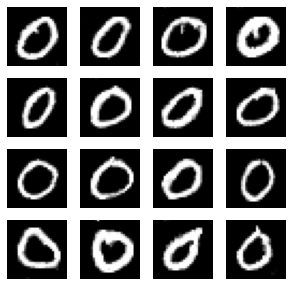

4/4 [==============================] - 0s 2ms/step
18800, [D loss: 0.204646, acc.: 0.20%], [G loss: 3.825810]
1/1 [==============================] - 0s 16ms/step


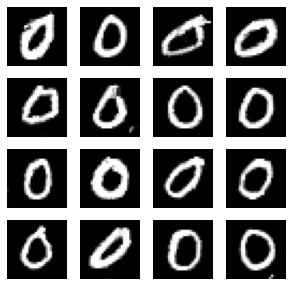

4/4 [==============================] - 0s 2ms/step
18900, [D loss: 0.152541, acc.: 0.15%], [G loss: 3.752988]
1/1 [==============================] - 0s 16ms/step


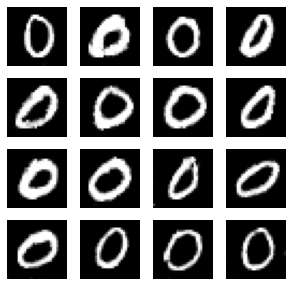

4/4 [==============================] - 0s 2ms/step
19000, [D loss: 0.176701, acc.: 0.18%], [G loss: 4.067343]
1/1 [==============================] - 0s 18ms/step


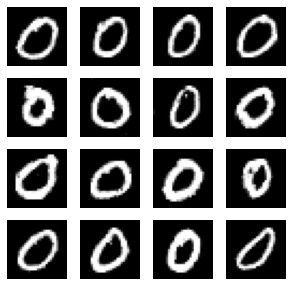

4/4 [==============================] - 0s 2ms/step
19100, [D loss: 0.156166, acc.: 0.16%], [G loss: 3.298858]
1/1 [==============================] - 0s 16ms/step


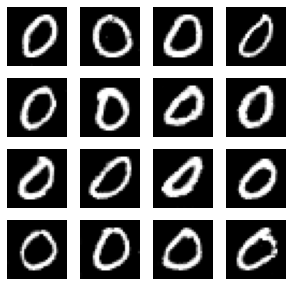

4/4 [==============================] - 0s 2ms/step
19200, [D loss: 0.232646, acc.: 0.23%], [G loss: 3.536487]
1/1 [==============================] - 0s 17ms/step


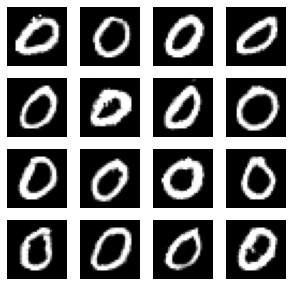

4/4 [==============================] - 0s 2ms/step
19300, [D loss: 0.170666, acc.: 0.17%], [G loss: 4.263539]
1/1 [==============================] - 0s 17ms/step


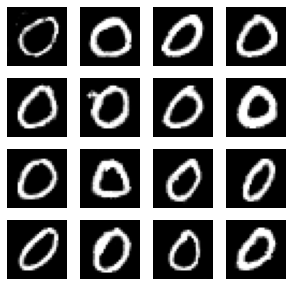

4/4 [==============================] - 0s 2ms/step
19400, [D loss: 0.206734, acc.: 0.21%], [G loss: 3.611836]
1/1 [==============================] - 0s 16ms/step


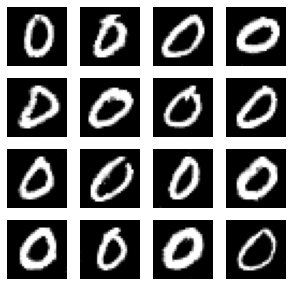

4/4 [==============================] - 0s 2ms/step
19500, [D loss: 0.140672, acc.: 0.14%], [G loss: 3.832330]
1/1 [==============================] - 0s 18ms/step


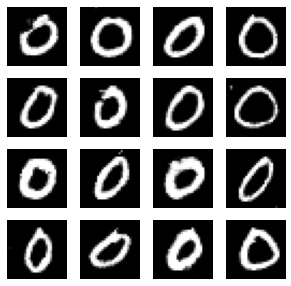

4/4 [==============================] - 0s 2ms/step
19600, [D loss: 0.253087, acc.: 0.25%], [G loss: 5.078927]
1/1 [==============================] - 0s 16ms/step


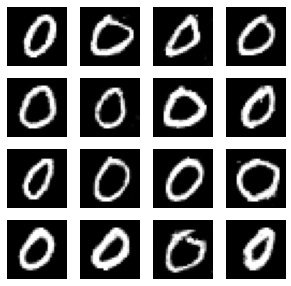

4/4 [==============================] - 0s 2ms/step
19700, [D loss: 0.241068, acc.: 0.24%], [G loss: 4.081900]
1/1 [==============================] - 0s 17ms/step


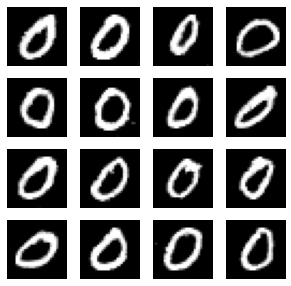

4/4 [==============================] - 0s 2ms/step
19800, [D loss: 0.175916, acc.: 0.18%], [G loss: 4.186549]
1/1 [==============================] - 0s 17ms/step


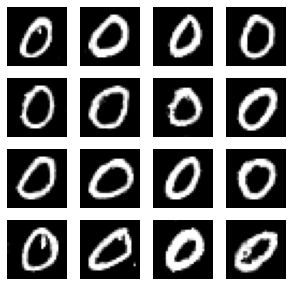

4/4 [==============================] - 0s 2ms/step
19900, [D loss: 0.235419, acc.: 0.24%], [G loss: 3.794330]
1/1 [==============================] - 0s 16ms/step


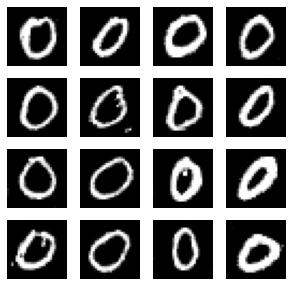

4/4 [==============================] - 0s 2ms/step
20000, [D loss: 0.207649, acc.: 0.21%], [G loss: 4.490768]
1/1 [==============================] - 0s 16ms/step


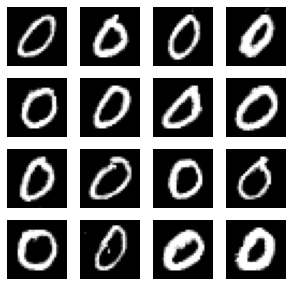

4/4 [==============================] - 0s 2ms/step
20100, [D loss: 0.189581, acc.: 0.19%], [G loss: 4.021087]
1/1 [==============================] - 0s 16ms/step


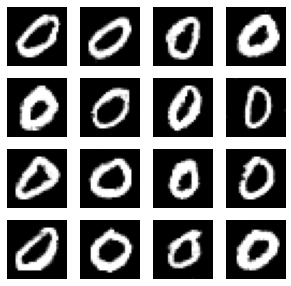

4/4 [==============================] - 0s 3ms/step
20200, [D loss: 0.181246, acc.: 0.18%], [G loss: 4.351854]
1/1 [==============================] - 0s 17ms/step


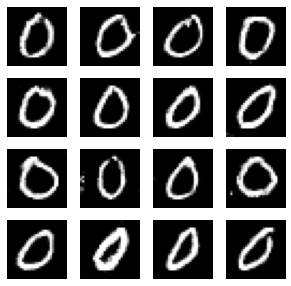

4/4 [==============================] - 0s 2ms/step
20300, [D loss: 0.152779, acc.: 0.15%], [G loss: 4.450254]
1/1 [==============================] - 0s 16ms/step


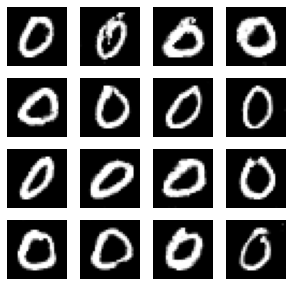

4/4 [==============================] - 0s 2ms/step
20400, [D loss: 0.156289, acc.: 0.16%], [G loss: 4.738024]
1/1 [==============================] - 0s 16ms/step


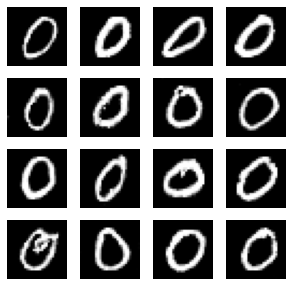

4/4 [==============================] - 0s 2ms/step
20500, [D loss: 0.167061, acc.: 0.17%], [G loss: 4.787755]
1/1 [==============================] - 0s 16ms/step


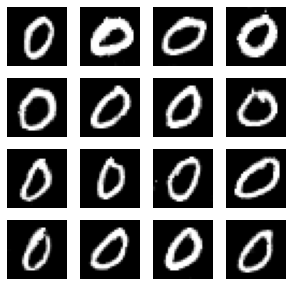

4/4 [==============================] - 0s 2ms/step
20600, [D loss: 0.108075, acc.: 0.11%], [G loss: 4.998846]
1/1 [==============================] - 0s 16ms/step


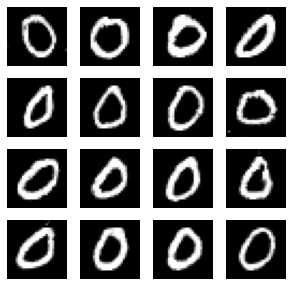

4/4 [==============================] - 0s 2ms/step
20700, [D loss: 0.157689, acc.: 0.16%], [G loss: 4.322500]
1/1 [==============================] - 0s 18ms/step


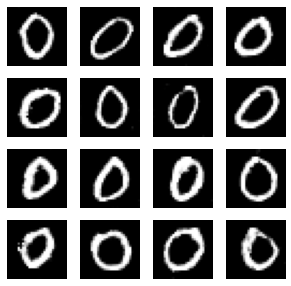

4/4 [==============================] - 0s 2ms/step
20800, [D loss: 0.177232, acc.: 0.18%], [G loss: 4.706077]
1/1 [==============================] - 0s 21ms/step


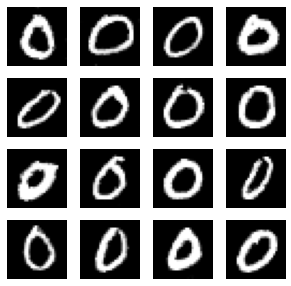

4/4 [==============================] - 0s 2ms/step
20900, [D loss: 0.152097, acc.: 0.15%], [G loss: 5.508977]
1/1 [==============================] - 0s 16ms/step


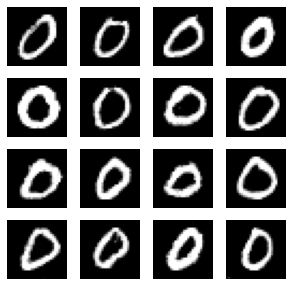

4/4 [==============================] - 0s 2ms/step
21000, [D loss: 0.156701, acc.: 0.16%], [G loss: 4.779435]
1/1 [==============================] - 0s 16ms/step


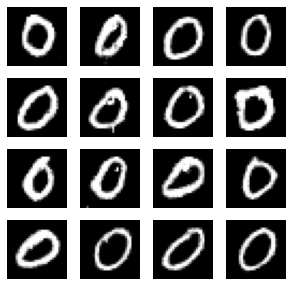

4/4 [==============================] - 0s 2ms/step
21100, [D loss: 0.167022, acc.: 0.17%], [G loss: 4.567479]
1/1 [==============================] - 0s 17ms/step


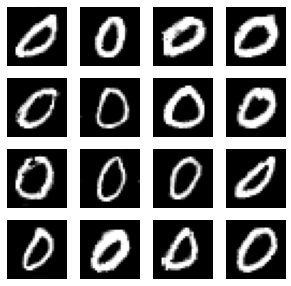

4/4 [==============================] - 0s 2ms/step
21200, [D loss: 0.168303, acc.: 0.17%], [G loss: 3.827814]
1/1 [==============================] - 0s 16ms/step


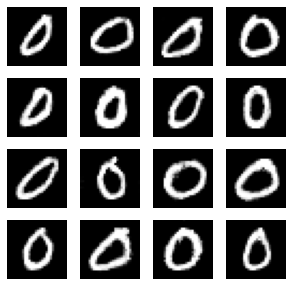

4/4 [==============================] - 0s 2ms/step
21300, [D loss: 0.170795, acc.: 0.17%], [G loss: 4.885950]
1/1 [==============================] - 0s 15ms/step


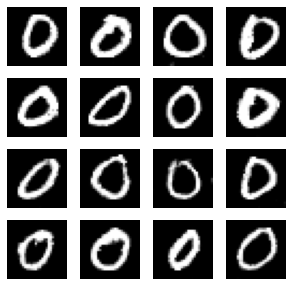

4/4 [==============================] - 0s 2ms/step
21400, [D loss: 0.106091, acc.: 0.11%], [G loss: 5.510183]
1/1 [==============================] - 0s 16ms/step


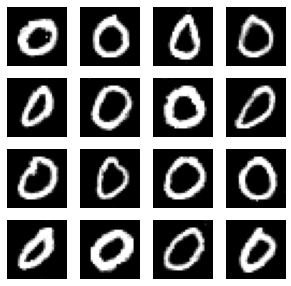

4/4 [==============================] - 0s 2ms/step
21500, [D loss: 0.128734, acc.: 0.13%], [G loss: 5.026958]
1/1 [==============================] - 0s 18ms/step


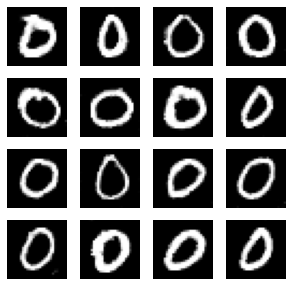

4/4 [==============================] - 0s 2ms/step
21600, [D loss: 0.118754, acc.: 0.12%], [G loss: 5.344585]
1/1 [==============================] - 0s 16ms/step


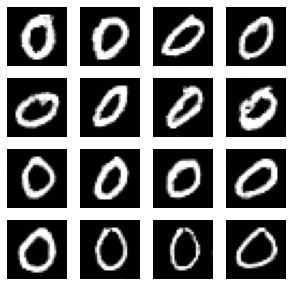

4/4 [==============================] - 0s 2ms/step
21700, [D loss: 0.155285, acc.: 0.16%], [G loss: 4.258070]
1/1 [==============================] - 0s 17ms/step


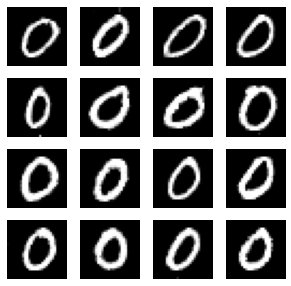

4/4 [==============================] - 0s 7ms/step
21800, [D loss: 0.132431, acc.: 0.13%], [G loss: 5.649366]
1/1 [==============================] - 0s 16ms/step


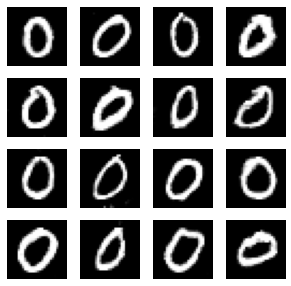

4/4 [==============================] - 0s 2ms/step
21900, [D loss: 0.147340, acc.: 0.15%], [G loss: 4.787625]
1/1 [==============================] - 0s 21ms/step


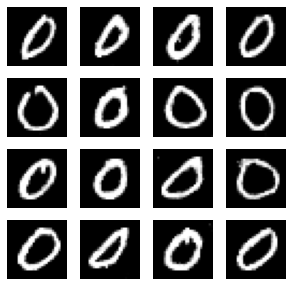

4/4 [==============================] - 0s 2ms/step
22000, [D loss: 0.171826, acc.: 0.17%], [G loss: 5.148326]
1/1 [==============================] - 0s 16ms/step


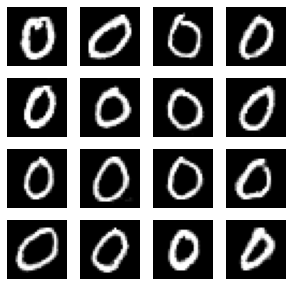

4/4 [==============================] - 0s 4ms/step
22100, [D loss: 0.155784, acc.: 0.16%], [G loss: 5.140913]
1/1 [==============================] - 0s 17ms/step


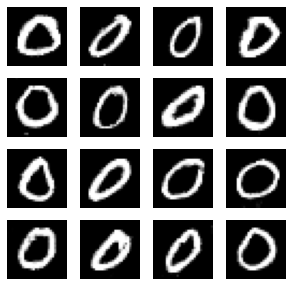

4/4 [==============================] - 0s 2ms/step
22200, [D loss: 0.100127, acc.: 0.10%], [G loss: 5.634405]
1/1 [==============================] - 0s 16ms/step


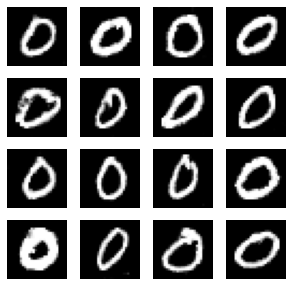

4/4 [==============================] - 0s 2ms/step
22300, [D loss: 0.178049, acc.: 0.18%], [G loss: 5.187994]
1/1 [==============================] - 0s 16ms/step


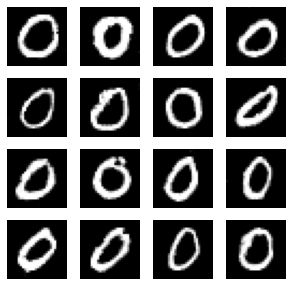

4/4 [==============================] - 0s 2ms/step
22400, [D loss: 0.107048, acc.: 0.11%], [G loss: 5.072832]
1/1 [==============================] - 0s 16ms/step


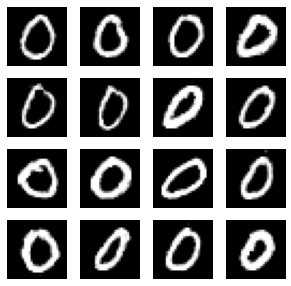

4/4 [==============================] - 0s 2ms/step
22500, [D loss: 0.110373, acc.: 0.11%], [G loss: 5.560875]
1/1 [==============================] - 0s 16ms/step


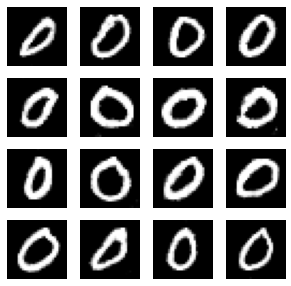

4/4 [==============================] - 0s 2ms/step
22600, [D loss: 0.119602, acc.: 0.12%], [G loss: 5.676038]
1/1 [==============================] - 0s 17ms/step


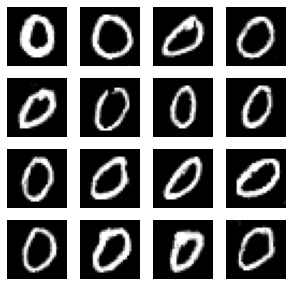

4/4 [==============================] - 0s 2ms/step
22700, [D loss: 0.085850, acc.: 0.09%], [G loss: 6.241481]
1/1 [==============================] - 0s 17ms/step


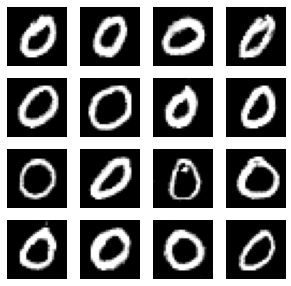

4/4 [==============================] - 0s 2ms/step
22800, [D loss: 0.095738, acc.: 0.10%], [G loss: 4.639502]
1/1 [==============================] - 0s 16ms/step


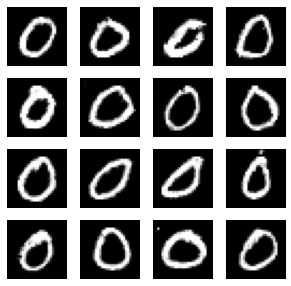

4/4 [==============================] - 0s 2ms/step
22900, [D loss: 0.101374, acc.: 0.10%], [G loss: 5.481560]
1/1 [==============================] - 0s 16ms/step


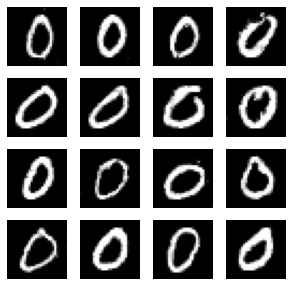

4/4 [==============================] - 0s 2ms/step
23000, [D loss: 0.120007, acc.: 0.12%], [G loss: 5.129848]
1/1 [==============================] - 0s 17ms/step


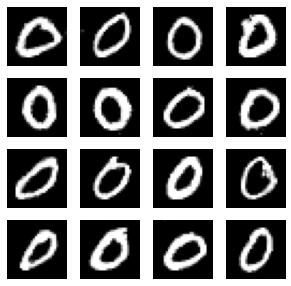

4/4 [==============================] - 0s 2ms/step
23100, [D loss: 0.121365, acc.: 0.12%], [G loss: 5.399323]
1/1 [==============================] - 0s 16ms/step


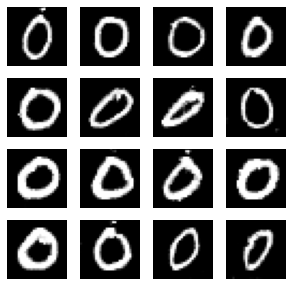

4/4 [==============================] - 0s 2ms/step
23200, [D loss: 0.142012, acc.: 0.14%], [G loss: 5.295324]
1/1 [==============================] - 0s 16ms/step


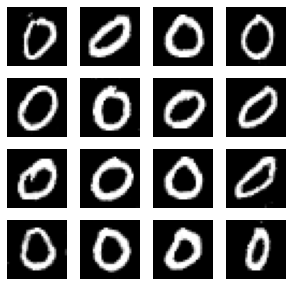

4/4 [==============================] - 0s 2ms/step
23300, [D loss: 0.076672, acc.: 0.08%], [G loss: 5.716056]
1/1 [==============================] - 0s 16ms/step


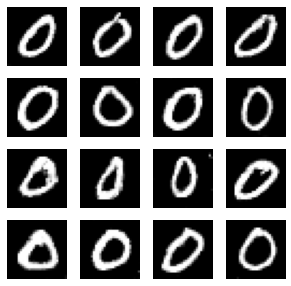

4/4 [==============================] - 0s 2ms/step
23400, [D loss: 0.172512, acc.: 0.17%], [G loss: 5.515553]
1/1 [==============================] - 0s 17ms/step


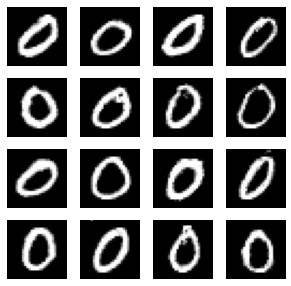

4/4 [==============================] - 0s 2ms/step
23500, [D loss: 0.133860, acc.: 0.13%], [G loss: 5.915459]
1/1 [==============================] - 0s 16ms/step


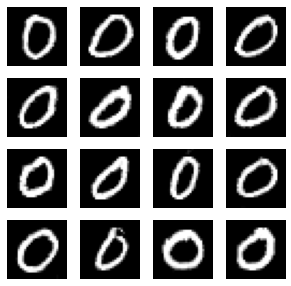

4/4 [==============================] - 0s 2ms/step
23600, [D loss: 0.090283, acc.: 0.09%], [G loss: 5.410963]
1/1 [==============================] - 0s 16ms/step


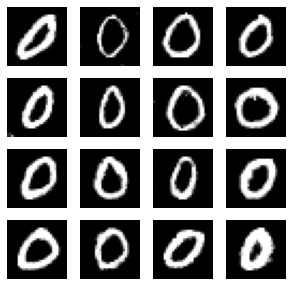

4/4 [==============================] - 0s 2ms/step
23700, [D loss: 0.081990, acc.: 0.08%], [G loss: 6.158448]
1/1 [==============================] - 0s 16ms/step


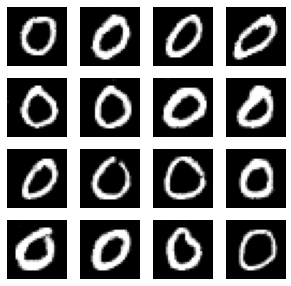

4/4 [==============================] - 0s 2ms/step
23800, [D loss: 0.116152, acc.: 0.12%], [G loss: 5.780105]
1/1 [==============================] - 0s 16ms/step


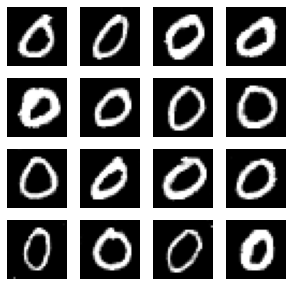

4/4 [==============================] - 0s 2ms/step
23900, [D loss: 0.113904, acc.: 0.11%], [G loss: 6.244946]
1/1 [==============================] - 0s 16ms/step


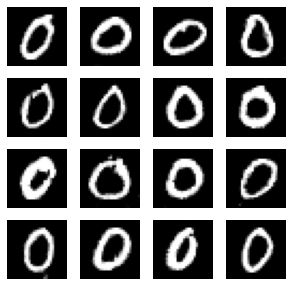

4/4 [==============================] - 0s 2ms/step
24000, [D loss: 0.120906, acc.: 0.12%], [G loss: 5.924585]
1/1 [==============================] - 0s 17ms/step


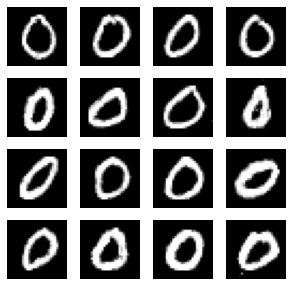

4/4 [==============================] - 0s 2ms/step
24100, [D loss: 0.163118, acc.: 0.16%], [G loss: 4.796743]
1/1 [==============================] - 0s 16ms/step


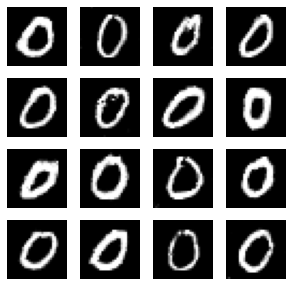

4/4 [==============================] - 0s 2ms/step
24200, [D loss: 0.118331, acc.: 0.12%], [G loss: 6.048244]
1/1 [==============================] - 0s 15ms/step


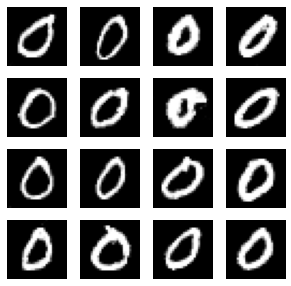

4/4 [==============================] - 0s 2ms/step
24300, [D loss: 0.135645, acc.: 0.14%], [G loss: 4.969207]
1/1 [==============================] - 0s 15ms/step


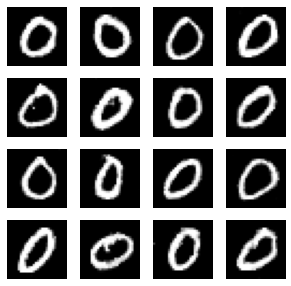

4/4 [==============================] - 0s 8ms/step
24400, [D loss: 0.126881, acc.: 0.13%], [G loss: 6.377702]
1/1 [==============================] - 0s 16ms/step


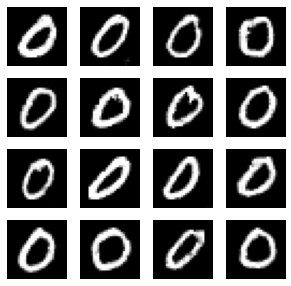

4/4 [==============================] - 0s 2ms/step
24500, [D loss: 0.162591, acc.: 0.16%], [G loss: 6.181160]
1/1 [==============================] - 0s 15ms/step


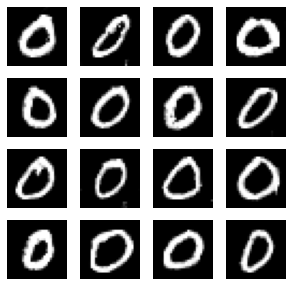

4/4 [==============================] - 0s 2ms/step
24600, [D loss: 0.146528, acc.: 0.15%], [G loss: 5.773844]
1/1 [==============================] - 0s 17ms/step


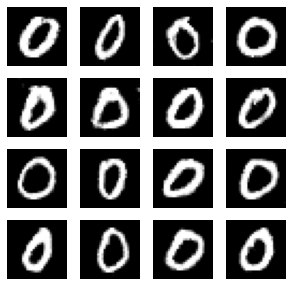

4/4 [==============================] - 0s 2ms/step
24700, [D loss: 0.108232, acc.: 0.11%], [G loss: 6.038113]
1/1 [==============================] - 0s 17ms/step


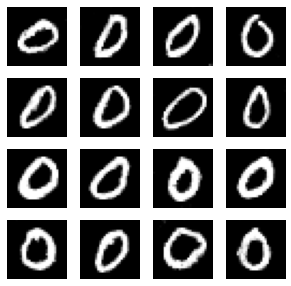

4/4 [==============================] - 0s 2ms/step
24800, [D loss: 0.081529, acc.: 0.08%], [G loss: 5.639817]
1/1 [==============================] - 0s 16ms/step


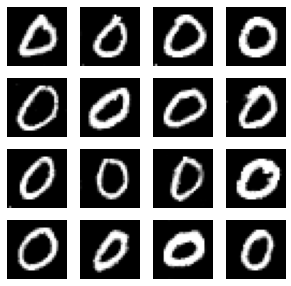

4/4 [==============================] - 0s 2ms/step
24900, [D loss: 0.111850, acc.: 0.11%], [G loss: 6.551210]
1/1 [==============================] - 0s 29ms/step


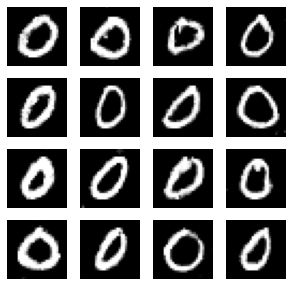

4/4 [==============================] - 0s 2ms/step
25000, [D loss: 0.192834, acc.: 0.19%], [G loss: 4.846057]
1/1 [==============================] - 0s 17ms/step


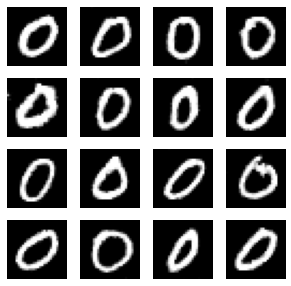

4/4 [==============================] - 0s 2ms/step
25100, [D loss: 0.083759, acc.: 0.08%], [G loss: 6.563514]
1/1 [==============================] - 0s 16ms/step


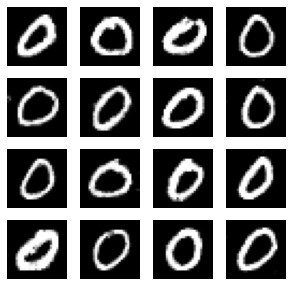

4/4 [==============================] - 0s 2ms/step
25200, [D loss: 0.098757, acc.: 0.10%], [G loss: 6.959772]
1/1 [==============================] - 0s 16ms/step


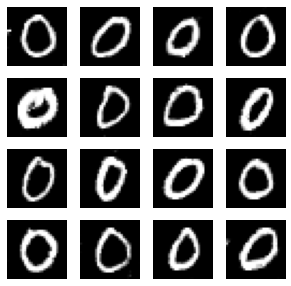

4/4 [==============================] - 0s 2ms/step
25300, [D loss: 0.096619, acc.: 0.10%], [G loss: 6.779102]
1/1 [==============================] - 0s 16ms/step


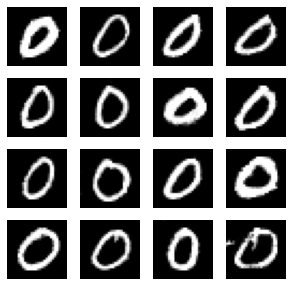

4/4 [==============================] - 0s 2ms/step
25400, [D loss: 0.059142, acc.: 0.06%], [G loss: 6.897942]
1/1 [==============================] - 0s 15ms/step


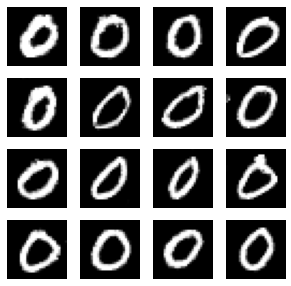

4/4 [==============================] - 0s 2ms/step
25500, [D loss: 0.092908, acc.: 0.09%], [G loss: 6.446358]
1/1 [==============================] - 0s 15ms/step


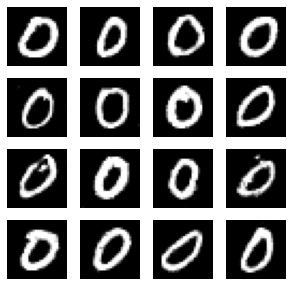

4/4 [==============================] - 0s 2ms/step
25600, [D loss: 0.119681, acc.: 0.12%], [G loss: 6.489464]
1/1 [==============================] - 0s 17ms/step


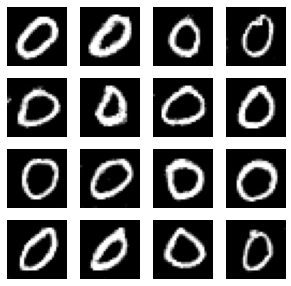

4/4 [==============================] - 0s 2ms/step
25700, [D loss: 0.092006, acc.: 0.09%], [G loss: 6.219258]
1/1 [==============================] - 0s 16ms/step


KeyboardInterrupt: ignored

In [9]:
for epoch in range(epochs):
    idx = np.random.randint(0, x_train.shape[0], batch_size)
    real_imgs = x_train[idx]

    z = np.random.normal(0, 1, (batch_size, noise))
    fake_imgs = generator.predict(z)

    d_hist_real = discriminator.train_on_batch(real_imgs, real)
    d_hist_fake = discriminator.train_on_batch(fake_imgs, fake)

    d_loss, d_acc = np.add(d_hist_fake, d_hist_real) * 0.5



    if epoch % 2 == 0:
        z = np.random.normal(0, 1, (batch_size, noise))
        gan_hist = gan_model.train_on_batch(z, real)

    if epoch % sample_interval == 0:
        print('%d, [D loss: %f, acc.: %.2f%%], [G loss: %f]'%(
                    epoch, d_loss, d_loss, gan_hist))
        row = col = 4
        z = np.random.normal(0, 1, (row * col, noise))
        fake_imgs = generator.predict(z)
        fake_imgs = 0.5 * fake_imgs + 0.5
        _, axs = plt.subplots(row, col, figsize=(5, 5), sharey=True, sharex=True)
        cont = 0
        for i in range(row):
            for j in range(col):
                axs[i, j].imshow(fake_imgs[cont, :, :, 0], cmap='gray')
                axs[i, j].axis('off')
                cont += 1
        path = os.path.join(OUT_DIR, 'img-{}'.format(epoch+1))
        plt.show()
        plt.close()
        generator.save('/content/drive/MyDrive/과정들/아시아 부트캠프 202210/GAN_models/generator_mnist_{}.h5'.format(MY_NUMBER))


In [3]:
number_GAN_models = []
for i in range(10):
    number_GAN_models.append(load_model(
        '/content/drive/MyDrive/과정들/아시아 부트캠프 202210/GAN_models/generator_mnist_{}.h5'.format(i)))

In [8]:
four_digit_number = '4621'


In [9]:
imgs = []
for i in four_digit_number:
    i = int(i)
    z = np.random.normal(0, 1, (1, 100))
    fake_img = number_GAN_models[i].predict(z)
    fake_img = 0.5 * fake_img + 0.5
    print(fake_img.shape)
    imgs.append(fake_img.reshape(28, 28))

1/1 [==============================] - 0s 18ms/step


(1, 28, 28, 1)
1/1 [==============================] - 0s 104ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 15ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 14ms/step
(1, 28, 28, 1)


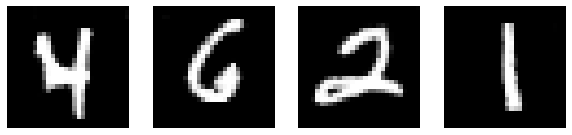

In [10]:
_, axs = plt.subplots(1, 4, figsize=(10, 40), sharex=True, sharey=True)
for i in range(4):
    axs[i].imshow(imgs[i], cmap='gray')
    axs[i].axis('off')
plt.show()

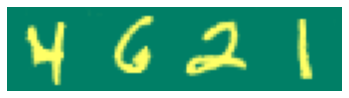

In [16]:
img = imgs[0]
for i in range(1, 4):
    img = np.append(img, imgs[i], axis=1)
plt.summer()
plt.imshow(img)
plt.axis('off')
plt.show()

462187
1/1 [==============================] - 0s 18ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 15ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 15ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 15ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 15ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 15ms/step
(1, 28, 28, 1)


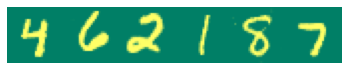

In [21]:
input_value = input()
imgs = []
for i in input_value:
    i = int(i)
    z = np.random.normal(0, 1, (1, 100))
    fake_img = number_GAN_models[i].predict(z)
    fake_img = 0.5 * fake_img + 0.5
    print(fake_img.shape)
    imgs.append(fake_img.reshape(28, 28))
img = imgs[0]
for i in range(1, len(input_value)):
    img = np.append(img, imgs[i], axis=1)
plt.summer()
plt.imshow(img)
plt.axis('off')
plt.show()